In [124]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

import warnings
from core import *
from data_manipulation import DataBatches, RandomCrop, RandomRotation, Flip
from train_functions import FinderPolicy, get_optimizer, validate_binary
from architectures import cnn
from utils import save_model, load_model

warnings.filterwarnings('ignore')

In [125]:
PATH = Path('../hand_data/')
path_250 = PATH/'boneage-250/'
path_224 = PATH/'boneage-224/'
OUT_SIZE = 1
IMG_PATHS = Path('../hand_data')/'boneage-250/'
GENERATOR_MODEL_PATHS = Path('../latest_models/2nd_set_experiments/genertor_models')
SYNTH_DATA_PATHS = Path('../latest_models/2nd_set_experiments/synthetic_data')
# GENERATOR_MODEL_PATHS = Path('../data/synthetic_experiment/hands/models/generator')
# SYNTH_DATA_PATHS = Path('../data/synthetic_experiment/hands/synthetic_data')

# Data preparation

In [126]:
# Load df's 
train_df = pd.read_csv(PATH/'train_df.csv')
valid_df = pd.read_csv(PATH / "valid_df.csv")
test_df = pd.read_csv(PATH / "test_df.csv")

def create_new_labels_with_median(df, median, old_col='boneage', new_col='boneage'):    
    df[new_col] = (df[old_col] > median).astype(int)
    return df

df = pd.concat([train_df, valid_df, test_df])
median = df['boneage'].median()

# Transform df's 
train_df = create_new_labels_with_median(train_df, median)
valid_df = create_new_labels_with_median(valid_df, median)
test_df = create_new_labels_with_median(test_df, median)

total = len(train_df) + len(valid_df) + len(test_df)
print(f"train: {len(train_df)/total*100:.2f}%\nvalidation: {len(valid_df)/total*100:.2f}%\ntest: {len(test_df)/total*100:.2f}%")
print(f'Total: {total}')

train: 70.71%
validation: 9.42%
test: 19.87%
Total: 12611


# Functions

In [156]:
# Store intermediate (Synthetic) data:

def store_synthetic_df(G, DFs, folder_path, paths, data, normalize=False, batch_size=16, seed=42):
    """
    This function create and store dataframes with the new labels given the model that produce them (G),
    the dataloaders list that the model use and the list of dataframe were the labels will be "replaced" and write
    it in  the list of files.

    Note: It stores the soft predictions (LOGITS) as Labels to optimize trying different threshold afterwards.

    Important: This function assumes:
        - Assums the lists have a corresponding order Ex: first element of ALL of them is for training,
                                                            second for validation, ...


    Ex:

    > DFs = [train_df,valid_df, test_df]
    > paths = [PATH/'synthetic_experiment/chest/generator/train_df_resnet18.csv',
    >         PATH/'synthetic_experiment/chest/generator/valid_df_resnet18.csv',
    >         PATH/'synthetic_experiment/chest/generator/test_df_resnet18.csv']
    >
    > store_synthetic_df(G, DFs, val_folder_path, paths, data=data, normalize=pretrained, bs=bs, seed=42)


    :param G: Generator model
    :param DFs: list of dataframes where to substitute
    :param DLs: list of dataloaders
    :param paths: list of paths were the dataframes will be stored
    :param threshold: to go from soft to hard predictions.
    :return: -
    """
    
    DLs = [DataBatches(df, img_folder_path=folder_path,
                       transforms=False, shuffle=False, normalize=normalize,
                       data=data, batch_size=batch_size, seed=seed) for df in DFs]
    
    for df, dl, path in zip(DFs, DLs, paths):
        Y_hat = np.concatenate(
            [(torch.sigmoid(G(x))).cpu().detach().numpy() for x, _ in dl], 0
        )

        df_synthetic = df.copy()
        df_synthetic.boneage = Y_hat.flatten().tolist()
        df_synthetic.to_csv(str(path), index=False)

def train(epochs, train_dl, valid_dl, model, save_path=None,
          min_lr=1e-6, max_lr=0.001, epsilon=.01):
    lr = max_lr
    prev_loss, min_loss = np.inf, np.inf
    
    for epoch in tqdm_notebook(range(epochs)):
        model.train()
        train_dl.set_random_choices()
        total = 0
        sum_loss = 0
        optim = get_optimizer(model, lr=lr, wd=0)
        for x, y in train_dl:
            batch = y.shape[0]
            out = model(x)
            loss = F.binary_cross_entropy_with_logits(out, y)
            optim.zero_grad()
            loss.backward()
            optim.step()
            total += batch
            sum_loss += batch * (loss.item())
                
        val_loss, measure, _ = validate_binary(model, valid_dl)
        if epoch%10==0: print(f'Ep. {epoch+1} - lr {lr:.7f} train loss {sum_loss/total:.4f} -  val loss {val_loss:.4f} AUC {measure:.4f}')

        if val_loss - prev_loss > epsilon:
            lr = lr / 10.0
        if val_loss < min_loss:
            if save_path: save_model(model, save_path)
            min_loss = val_loss
        prev_loss = val_loss
        if lr < min_lr:
            break
            

In [153]:
# ! mkdir ../data/synthetic_experiment/hands/models/generator

The dataloaders won't change over the different generator models:

In [157]:
normalize = False
batch_size = 16
epochs = 50

transformations = [RandomRotation(), Flip(), RandomCrop()]

train_dl = DataBatches(train_df, transforms=transformations, shuffle=True, normalize=normalize,
                       img_folder_path=IMG_PATHS, data="hands", batch_size=batch_size)

valid_dl = DataBatches(valid_df, transforms=False, shuffle=False, normalize=normalize,
                       img_folder_path=IMG_PATHS, data="hands", batch_size=batch_size)

DFs = [train_df, valid_df, test_df] # To be used later to store intermediate results

## Generator: cnn 8-channels

In [158]:
channels = [8]

model_path = GENERATOR_MODEL_PATHS/f'model-planes-{"-".join(map(str,channels))}.pth'

model = cnn(channels, OUT_SIZE).cuda()

train(epochs, train_dl, valid_dl, model, save_path=model_path,
      min_lr=1e-6, max_lr=0.001, epsilon=.01)

A Jupyter Widget

Ep. 1 - lr 0.0010000 train loss 0.6890 -  val loss 0.6845 AUC 0.5565
Ep. 11 - lr 0.0001000 train loss 0.6734 -  val loss 0.6670 AUC 0.6551
Ep. 21 - lr 0.0001000 train loss 0.6706 -  val loss 0.6663 AUC 0.6643
Ep. 31 - lr 0.0001000 train loss 0.6686 -  val loss 0.6606 AUC 0.6683
Ep. 41 - lr 0.0001000 train loss 0.6665 -  val loss 0.6587 AUC 0.6690


In [159]:
load_model(model, model_path)

paths = [SYNTH_DATA_PATHS/f'train-planes-{"-".join(map(str,channels))}.csv', SYNTH_DATA_PATHS/f'valid-planes-{"-".join(map(str,channels))}.csv', 
         SYNTH_DATA_PATHS/f'test-planes-{"-".join(map(str,channels))}.csv']

store_synthetic_df(model, DFs, IMG_PATHS, paths, data='hands', normalize=False, batch_size=16, seed=42)

## Generator: cnn 16-channels

In [160]:
channels = [16]

model_path = GENERATOR_MODEL_PATHS/f'model-planes-{"-".join(map(str,channels))}.pth'

model = cnn(channels, OUT_SIZE).cuda()

train(epochs, train_dl, valid_dl, model, save_path=model_path,
      min_lr=1e-6, max_lr=0.001, epsilon=.01)

A Jupyter Widget

Ep. 1 - lr 0.0010000 train loss 0.6882 -  val loss 0.6844 AUC 0.5555
Ep. 11 - lr 0.0001000 train loss 0.6721 -  val loss 0.6663 AUC 0.6329
Ep. 21 - lr 0.0001000 train loss 0.6708 -  val loss 0.6642 AUC 0.6460
Ep. 31 - lr 0.0001000 train loss 0.6637 -  val loss 0.6596 AUC 0.6775
Ep. 41 - lr 0.0001000 train loss 0.6600 -  val loss 0.6559 AUC 0.6833


In [161]:
load_model(model, model_path)

paths = [SYNTH_DATA_PATHS/f'train-planes-{"-".join(map(str,channels))}.csv', SYNTH_DATA_PATHS/f'valid-planes-{"-".join(map(str,channels))}.csv', 
         SYNTH_DATA_PATHS/f'test-planes-{"-".join(map(str,channels))}.csv']

store_synthetic_df(model, DFs, IMG_PATHS, paths, data='hands', normalize=False, batch_size=16, seed=42)

## Generator: cnn 32-channels

In [162]:
channels = [32]

model_path = GENERATOR_MODEL_PATHS/f'model-planes-{"-".join(map(str,channels))}.pth'

model = cnn(channels, OUT_SIZE).cuda()

train(epochs, train_dl, valid_dl, model, save_path=model_path,
      min_lr=1e-6, max_lr=0.001, epsilon=.01)

A Jupyter Widget

Ep. 1 - lr 0.0010000 train loss 0.6835 -  val loss 0.6779 AUC 0.5915
Ep. 11 - lr 0.0010000 train loss 0.6632 -  val loss 0.6578 AUC 0.6572
Ep. 21 - lr 0.0001000 train loss 0.6569 -  val loss 0.6517 AUC 0.6697
Ep. 31 - lr 0.0001000 train loss 0.6560 -  val loss 0.6495 AUC 0.6743
Ep. 41 - lr 0.0001000 train loss 0.6559 -  val loss 0.6474 AUC 0.6778


In [163]:
load_model(model, model_path)

paths = [SYNTH_DATA_PATHS/f'train-planes-{"-".join(map(str,channels))}.csv', SYNTH_DATA_PATHS/f'valid-planes-{"-".join(map(str,channels))}.csv', 
         SYNTH_DATA_PATHS/f'test-planes-{"-".join(map(str,channels))}.csv']

store_synthetic_df(model, DFs, IMG_PATHS, paths, data='hands', normalize=False, batch_size=16, seed=42)

## Generator: cnn 64-channels

In [164]:
channels = [64]

model_path = GENERATOR_MODEL_PATHS/f'model-planes-{"-".join(map(str,channels))}.pth'

model = cnn(channels, OUT_SIZE).cuda()

train(epochs, train_dl, valid_dl, model, save_path=model_path,
      min_lr=1e-6, max_lr=0.001, epsilon=.01)

A Jupyter Widget

Ep. 1 - lr 0.0010000 train loss 0.6862 -  val loss 0.6823 AUC 0.5527
Ep. 11 - lr 0.0010000 train loss 0.6611 -  val loss 0.7067 AUC 0.6051
Ep. 21 - lr 0.0001000 train loss 0.6563 -  val loss 0.6507 AUC 0.6753
Ep. 31 - lr 0.0001000 train loss 0.6549 -  val loss 0.6491 AUC 0.6795
Ep. 41 - lr 0.0001000 train loss 0.6546 -  val loss 0.6510 AUC 0.6814


In [165]:
load_model(model, model_path)

paths = [SYNTH_DATA_PATHS/f'train-planes-{"-".join(map(str,channels))}.csv', SYNTH_DATA_PATHS/f'valid-planes-{"-".join(map(str,channels))}.csv', 
         SYNTH_DATA_PATHS/f'test-planes-{"-".join(map(str,channels))}.csv']

store_synthetic_df(model, DFs, IMG_PATHS, paths, data='hands', normalize=False, batch_size=16, seed=42)

## Generator: Ridge

Functions from `multilabel_disease_traditional_app.ipynb`.

In [166]:
NUMERICAL_FEATURES_PATH = Path('../latest_data/2nd_set_experiments/numerical_features')

In [167]:
def read_image_gray(path):
    im = cv2.imread(str(path)).astype(np.uint8)
    return cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

def GLCM_features(im):
    GLCM = greycomatrix(im,[1,2,4,6], [0, np.pi/4, np.pi/2])
    properties = ['contrast','dissimilarity','homogeneity','ASM', 'energy', 'correlation']
    GLCM_features= [greycoprops(GLCM, prop) for prop in properties]
    return np.concatenate(GLCM_features).flatten()

def statistical_features(im):
    stat_feat1 = [np.mean(im),np.std(im)]
    stat_feat2 = [moment(im,moment=i,axis=None) for i in range(2,6)]
    return np.array(stat_feat1+stat_feat2)

def entropy(im):
        '''
        From https://www.hdm-stuttgart.de/~maucher/Python/MMCodecs/html/basicFunctions.html
        function returns entropy of a signal
        signal must be a 1-D numpy array
        '''
        signal = im.flatten()
        symset=list(set(signal))
        lensig=float(signal.size)
        propab=[np.size(signal[signal==i])/lensig for i in symset]
        ent=np.sum([p*np.log2(1.0/p) for p in propab])
        return np.array([ent])
    
def extract_features(im):
    features = [GLCM_features, statistical_features, entropy]
    return np.concatenate([feature(im) for feature in features])

def read_extract(im_path):
    im = read_image_gray(im_path)
    return extract_features(im)

def read_img2features(df, base_path):
    '''Reads  all the images under base_path/ImageIndex and extracts their features. 
    
    :param df: df with columns ImageIndex and Labels.
    :param base_path: base path such that base_path/ImageIndex is the location of the image.
    :return: X - numerical features, Y - labels
    '''
    X = np.array([read_extract(base_path/(str(row)+'.png')) for row in tqdm_notebook(df.id)])
    Y = df.boneage.values
    try: Y = np.array(list(map(labels2array, Y))) # 14 labels
    except: Y = Y.astype(int) # 1 label
    return X,Y

def replacy_by_mean(array):
    means = np.nanmean(array,axis=0)
    mask = np.where(np.isnan(array))
    array[mask] = np.take(means, mask[1])
    return array

def extract_save(train_df, valid_df, test_df):
    
    X_train, Y_train = read_img2features(train_df, base_path=IMG_PATHS)
    X_valid, Y_valid = read_img2features(valid_df, base_path=IMG_PATHS)
    X_test, Y_test = read_img2features(test_df, base_path=IMG_PATHS)

    # quantify NA's 

    # print(f"# {np.isnan(X_train).sum(axis=1).sum()} - {np.isnan(X_train).sum(axis=1).sum()/X_train.shape[0]:.3f}%")
    # print(f"# {np.isnan(X_valid).sum(axis=1).sum()} - {np.isnan(X_valid).sum(axis=1).sum()/X_valid.shape[0]:.3f}%")
    # print(f"# {np.isnan(X_test).sum(axis=1).sum()} - {np.isnan(X_test).sum(axis=1).sum()/X_test.shape[0]:.3f}%")

    # replace Na's 

    X_train, X_valid, X_test = map(replacy_by_mean, [X_train, X_valid, X_test])

    # save

    np.save(NUMERICAL_FEATURES_PATH/'X_train', X_train)
    np.save(NUMERICAL_FEATURES_PATH/'Y_train', Y_train)

    np.save(NUMERICAL_FEATURES_PATH/'X_valid', X_valid)
    np.save(NUMERICAL_FEATURES_PATH/'Y_valid', Y_valid)

    np.save(NUMERICAL_FEATURES_PATH/'X_test', X_test)
    np.save(NUMERICAL_FEATURES_PATH/'Y_test', Y_test)
    

extract_save(train_df, valid_df, test_df)

# Load
X_train = np.load(NUMERICAL_FEATURES_PATH/'X_train.npy')
Y_train = np.load(NUMERICAL_FEATURES_PATH/'Y_train.npy')

X_valid = np.load(NUMERICAL_FEATURES_PATH/'X_valid.npy')
Y_valid = np.load(NUMERICAL_FEATURES_PATH/'Y_valid.npy')

# X_test = np.load(NUMERICAL_FEATURES_PATH/'X_test.npy')
# Y_test = np.load(NUMERICAL_FEATURES_PATH/'Y_test.npy')

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

In [168]:
from sklearn.metrics import accuracy_score, roc_auc_score

class feature_ds(Dataset):

    def __init__(self, X,Y):
        self.X = X.astype(np.float32)
        self.Y = Y.astype(np.float32)

    def __getitem__(self, index):
        x = self.X[index,:]
        y = self.Y[index]
        return x, y

    def __len__(self): return self.X.shape[0]
    
class binary_log_reg(nn.Module):
    
    def __init__(self, in_dim=79, out_dim=1): 
        super(binary_log_reg, self).__init__()
        self.linear = nn.Linear(in_features=in_dim,out_features=out_dim)
        
    def forward(self, x):
        out = self.linear(x)
        return out
    
# Note: We are using L2 regularization, NOT weight decay!
def ridge_regularization(model, **kwarg):
    return sum([kwarg['alpha']*torch.norm(p, 2) for p in model.parameters()])

def validation(model, valid_dl):
    '''
    
    :return: val loss (with regularization), average auc
    '''
    model.eval()
    total = 0
    sum_loss = 0
    
    ys = []
    logits = []
    
    for x, y in valid_dl:
        batch = y.shape[0]
        x, y = x.cuda(), y.cuda()
        out = model(x)
        loss = F.binary_cross_entropy_with_logits(input=out.squeeze(),target=y)
        
        
        y.shape[0]
        sum_loss += batch * (loss.item())
        total += batch
        
        logits.append(out.cpu().detach().numpy())
        ys.append(y.long().cpu().numpy())

    ys = np.squeeze(np.array(ys))
    logits = np.squeeze(np.array(logits))
#     print(np.squeeze(ys), np.squeeze(logits))
    auc = roc_auc_score(ys, logits)

    return sum_loss / total, auc

def train(model, dl_train, dl_val, path,
          lr_high=1e-2, lr_low=1e-7, epochs=4, epsilon=.01, **kwarg):
    
    lr = lr_high
    prev_loss = np.inf
    min_loss = np.inf
    reg_f = ridge_regularization
    
    for epoch in tqdm_notebook(range(epochs), leave=False):
        model.train()
        total,sum_loss = 0,0
        optim = torch.optim.Adam(model.parameters(), lr=lr)
        for x,y in dl_train:

            x,y = x.cuda(),y.cuda()
            
            pred = model(x)
            loss = F.binary_cross_entropy_with_logits(input=pred.squeeze(),target=y) + reg_f(model, **kwarg)
            
            optim.zero_grad()
            loss.backward()
            optim.step()

            batch = y.shape[0]
            sum_loss += batch * (loss.item())
            total += batch

        val_loss, auc = validation(model, dl_val)
        
        if epoch%10==0: print(f"lr {lr:.7f} train loss {sum_loss/total:.3f} - val loss {val_loss} AUC - {auc}")
        
        if val_loss - prev_loss > epsilon:
            lr = lr / 10.0
        if val_loss < min_loss:
            save_model(model, path)
            min_loss = val_loss
        prev_loss = val_loss
        if lr < lr_low:
            break
    return min_loss

In [169]:
# train_ds = feature_ds(X_train, Y_train)
# valid_ds = feature_ds(X_valid, Y_valid)
# # test_ds = feature_ds(X_test, Y_test)

# dl_train = DataLoader(train_ds, batch_size=Y_train.shape[0], shuffle=True)
# dl_valid = DataLoader(valid_ds, batch_size=Y_valid.shape[0], shuffle=True)

In [171]:
# Training
alpha = .05
kwarg = {'alpha': alpha}

train_ds = feature_ds(X_train, Y_train)
dl_train = DataLoader(train_ds, batch_size=Y_train.shape[0], shuffle=True)

valid_ds = feature_ds(X_valid, Y_valid)
dl_valid = DataLoader(valid_ds, batch_size=Y_valid.shape[0], shuffle=True)
        
lin_model = binary_log_reg().cuda()

save_path = GENERATOR_MODEL_PATHS/'ridge_{alpha}.pth'

train(model=lin_model, dl_train=dl_train, dl_val=dl_valid,
      path=save_path, lr_low=1e-6, lr_high=1e-2, epochs=50, **kwarg)

A Jupyter Widget

lr 0.0100000 train loss 121904824.000 - val loss 102536584.0 AUC - 0.45033872939348585
lr 0.0010000 train loss 13126614.000 - val loss 9250026.0 AUC - 0.507482892166383
lr 0.0001000 train loss 2812918.000 - val loss 2475134.75 AUC - 0.5572498372042545
lr 0.0000100 train loss 2133710.750 - val loss 1917883.375 AUC - 0.569705139775856


1907756.125

In [151]:
# load_model(lin_model, save_path)

# x,_ = next(iter(dl))
# x = x.cuda()
# torch.sigmoid(lin_model(x)).cpu().detach().numpy()

In [172]:
paths = [SYNTH_DATA_PATHS/f'train-ridge.csv', SYNTH_DATA_PATHS/f'valid-ridge.csv', 
         SYNTH_DATA_PATHS/f'test-ridge.csv']

store_synthetic_df(model, DFs, IMG_PATHS, paths, data='hands', normalize=False, batch_size=16, seed=42)

DLs = [DataLoader(feature_ds(X, Y), batch_size=Y.shape[0], shuffle=False) for X, Y in [(X_train,Y_train),
                                                                                      (X_valid,Y_valid),
                                                                                      (X_test,Y_test)]]

for df, dl, path in zip(DFs, DLs, paths):
    x,_ = next(iter(dl))
    x = x.cuda()
    Y_hat = torch.sigmoid(lin_model(x)).cpu().detach().numpy()
    df_synthetic = df.copy()
    df_synthetic.boneage = Y_hat.flatten().tolist()
    df_synthetic.to_csv(str(path), index=False)

# Choose threshold and fitter

In [173]:
def read_dfs(paths):
    return [pd.read_csv(p) for p in paths]

def df_concatenate(dfs):
    '''Concatenate dfs'''
    return pd.concat(dfs).reset_index(drop=True)

def soft2hard(array, threshold=.5):
    """
    Given the label column of the dataframe will return 1/0 depending on > threshold or < threshold respectively.
    """
    if isinstance(array[0],str):
        seq_int = np.array([[int(float(item) > threshold) for item in record.split(' ')] for record in array])
    else:
        seq_int = np.array([int(float(record) > threshold) for record in array])
    return seq_int

def percentage_over_threshold(array, threshold=.5):
    """
    Computes the total number of positive cases over the total number of labels:

    Careful: Total number  of labels, not records!
    """
    array = soft2hard(array, threshold=threshold)
    p_s = np.sum(array) / (array.size)
    return f"{p_s*100:.3f}%"

def check_thresholds(df, ts=[.6, .5, .4, .3, .2], col='boneage'):

    prtgs = [percentage_over_threshold(df[col].values, t) for t in ts]
    ths = [f'Synthetic with tr={t}' for t in ts]
    rows = [(f"Original with tr={.5}", f"{50.:.3f}" + '%')] + list(zip(ths, prtgs))
    return pd.DataFrame(rows, columns=["Threshold", "Positive Rate"])

In [174]:
# ! ls $SYNTH_DATA_PATHS

In [180]:
channels = [8]
paths = [SYNTH_DATA_PATHS/f'train-planes-{"-".join(map(str,channels))}.csv', SYNTH_DATA_PATHS/f'valid-planes-{"-".join(map(str,channels))}.csv', 
         SYNTH_DATA_PATHS/f'test-planes-{"-".join(map(str,channels))}.csv']
Df = df_concatenate(read_dfs(paths))
check_thresholds(Df, [.5,.48,.47,.468,.46])

,Threshold,Positive Rate
0,Original with tr=0.5,50.000%
1,Synthetic with tr=0.5,31.702%
2,Synthetic with tr=0.48,41.702%
3,Synthetic with tr=0.47,48.775%
4,Synthetic with tr=0.468,50.147%
5,Synthetic with tr=0.46,56.609%


In [181]:
channels = [16]
paths = [SYNTH_DATA_PATHS/f'train-planes-{"-".join(map(str,channels))}.csv', SYNTH_DATA_PATHS/f'valid-planes-{"-".join(map(str,channels))}.csv', 
         SYNTH_DATA_PATHS/f'test-planes-{"-".join(map(str,channels))}.csv']
Df = df_concatenate(read_dfs(paths))
check_thresholds(Df, [.5,.48,.459, .456, .455])

,Threshold,Positive Rate
0,Original with tr=0.5,50.000%
1,Synthetic with tr=0.5,29.339%
2,Synthetic with tr=0.48,37.475%
3,Synthetic with tr=0.459,50.694%
4,Synthetic with tr=0.456,52.843%
5,Synthetic with tr=0.455,53.620%


In [183]:
channels = [32]
paths = [SYNTH_DATA_PATHS/f'train-planes-{"-".join(map(str,channels))}.csv', SYNTH_DATA_PATHS/f'valid-planes-{"-".join(map(str,channels))}.csv', 
         SYNTH_DATA_PATHS/f'test-planes-{"-".join(map(str,channels))}.csv']
Df = df_concatenate(read_dfs(paths))
check_thresholds(Df, [.51,.508,.5,.48,.46])

,Threshold,Positive Rate
0,Original with tr=0.5,50.000%
1,Synthetic with tr=0.51,33.875%
2,Synthetic with tr=0.508,34.295%
3,Synthetic with tr=0.5,36.484%
4,Synthetic with tr=0.48,42.923%
5,Synthetic with tr=0.46,50.773%


In [189]:
channels = [64]
paths = [SYNTH_DATA_PATHS/f'train-planes-{"-".join(map(str,channels))}.csv', SYNTH_DATA_PATHS/f'valid-planes-{"-".join(map(str,channels))}.csv', 
         SYNTH_DATA_PATHS/f'test-planes-{"-".join(map(str,channels))}.csv']
Df = df_concatenate(read_dfs(paths))
check_thresholds(Df, [.525,.52,.5,.48,.47,.466])

,Threshold,Positive Rate
0,Original with tr=0.5,50.000%
1,Synthetic with tr=0.525,31.187%
2,Synthetic with tr=0.52,32.472%
3,Synthetic with tr=0.5,37.927%
4,Synthetic with tr=0.48,44.675%
5,Synthetic with tr=0.47,48.569%
6,Synthetic with tr=0.466,50.353%


In [192]:
paths = [SYNTH_DATA_PATHS/f'train-ridge.csv', SYNTH_DATA_PATHS/f'valid-ridge.csv', 
         SYNTH_DATA_PATHS/f'test-ridge.csv']
Df = df_concatenate(read_dfs(paths))
check_thresholds(Df, [.999,.52,.5,.48,.47,.001])

,Threshold,Positive Rate
0,Original with tr=0.5,50.000%
1,Synthetic with tr=0.999,37.777%
2,Synthetic with tr=0.52,37.777%
3,Synthetic with tr=0.5,37.777%
4,Synthetic with tr=0.48,37.777%
5,Synthetic with tr=0.47,37.777%
6,Synthetic with tr=0.001,37.777%


**Thresholds**:

8 channels:   0.468

16 channels:   0.459

32 channels:   0.46

64 channels:   0.466

Ridge: NA ->0.5

# Train "fitters"

In [196]:
def convert(DFs, threshold):
    out = []
    for df in DFs:
        df2 = df.copy()
        df2.boneage = soft2hard(df2.boneage.values, threshold=.5)
        out.append(df2)
    return out

## 8 channels

In [197]:
channels = [8]
threshold = .468

In [198]:
train_df_h, valid_df_h, test_df_h = convert(DFs, threshold)

In [200]:
train_df_h.head()

,id,boneage,male
0,1377,1,False
1,1380,0,True
2,1381,0,False
3,1382,1,True
4,1383,1,True


In [ ]:
model = cnn(channels, OUT_SIZE).cuda()

train(epochs, train_dl, valid_dl, model, save_path=model_path,
      min_lr=1e-6, max_lr=0.001, epsilon=.01)

# Corrected Generator

In [92]:
#  default for densenet
width_per_group = 64
groups = 1
planes = [int(width_per_group * groups * 2 ** i) for i in range(4)]
print(planes, 'channels per block')

[64, 128, 256, 512]   per block


Note Densenet has less paramters in case we want to do a reduced version of this one. 

In [93]:
channels = [8, 16, 32, 64]

generator = handy_generator(channels)

train


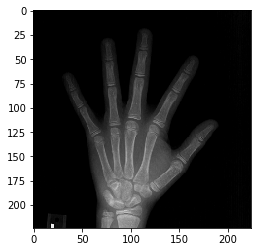

validation


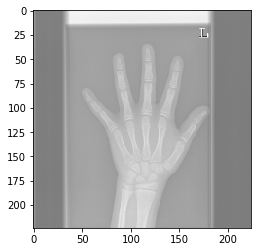

In [94]:
generator.create_training_dl(train_df=train_df,valid_df=valid_df, check=True)

In [95]:
generator.fit()

A Jupyter Widget

Ep. 1 - train loss 0.6915 -  val loss 0.6875 AUC 0.5907
Ep. 2 - train loss 0.6888 -  val loss 0.6801 AUC 0.6492
Ep. 3 - train loss 0.6873 -  val loss 0.6792 AUC 0.6524
Ep. 4 - train loss 0.6859 -  val loss 0.6786 AUC 0.6518
Ep. 5 - train loss 0.6841 -  val loss 0.6735 AUC 0.6582
Ep. 6 - train loss 0.6799 -  val loss 0.6718 AUC 0.6536
Ep. 7 - train loss 0.6792 -  val loss 0.6716 AUC 0.6500
Ep. 8 - train loss 0.6779 -  val loss 0.6681 AUC 0.6573
Ep. 9 - train loss 0.6785 -  val loss 0.6681 AUC 0.6576
Ep. 10 - train loss 0.6775 -  val loss 0.6680 AUC 0.6579



In [195]:
hg = handy_generator([64])

In [196]:
n_parameters(hg.model)

74369

In [207]:
model = adapt_to_problem(models.resnet34, 1, pretrained=False,freeze=False)

In [208]:
n_parameters(model)

21285185

# Generator

In [28]:
planes = [64]
n_blocks = 1

# Define the generator model
HG = handy_generator(planes)

In [29]:
# Sanity check
HG.n_paramters()
HG.model_path

Your model has 74369 learnable parameters


PosixPath('../hand_data/synthetic_experiment/generator/model-blocks-1-planes-64.pth')

In [30]:
# Sanity check
HG.model

meta_generator(
  (conv1): Conv2d(3, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (block_seq): Sequential(
    (block0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(1, 1))
  (lin): Linear(in_features=64, out_features=1, bias=True)
)

train


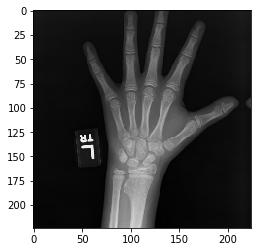

validation


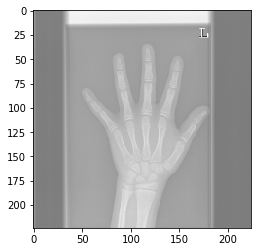

In [31]:
# Create training dl
HG.create_training_dl(train_df=train_df,valid_df=valid_df, check=True)

In [32]:
# Start training
# HG.fit()

In [33]:
# Alternatively, if we want to load an already-saved model we can go as:

# HG2 = handy_generator.load_model(planes)
# del HG2

In [34]:
HG.model

meta_generator(
  (conv1): Conv2d(3, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (block_seq): Sequential(
    (block0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(1, 1))
  (lin): Linear(in_features=64, out_features=1, bias=True)
)

In [63]:
# Either way we can now generate the df with the synthetic labels and store them in disk:

DFs = [train_df,valid_df, test_df]
paths = [PATH/f'synthetic_experiment/generator/train_df_blocks_{n_blocks}_planes_{planes[0]}.csv',
        PATH/f'synthetic_experiment/generator/valid_df_blocks_{n_blocks}_planes_{planes[0]}.csv',
        PATH/f'synthetic_experiment/generator/test_df_blocks_{n_blocks}_planes_{planes[0]}.csv']

HG.transform(DFs, paths)

# Fitter

In [36]:
generator_blocks = [32]
generator_n_blocks = len(generator_blocks)
# Load df created by the generator
generated_train_df = pd.read_csv(str(PATH/f'synthetic_experiment/generator/train_df_blocks_{generator_n_blocks}_planes_{"-".join([str(plane) for plane in generator_blocks])}.csv'))
generated_valid_df = pd.read_csv(str(PATH/f'synthetic_experiment/generator/valid_df_blocks_{generator_n_blocks}_planes_{"-".join([str(plane) for plane in generator_blocks])}.csv'))
generated_test_df = pd.read_csv(str(PATH/f'synthetic_experiment/generator/test_df_blocks_{generator_n_blocks}_planes_{"-".join([str(plane) for plane in generator_blocks])}.csv'))

In [37]:
generated_train_df.head()

,id,boneage,male
0,1377,0.777332,False
1,1380,0.757720,True
2,1381,0.153971,False
3,1382,0.248206,True
4,1383,0.161414,True


In [13]:
# HF = handy_fitter([32], blocks=[16] )  # example with blocks
HF = handy_fitter([32], predefined=models.resnet18) # example with pre-defined

In [14]:
HF.check_thresholds(generated_train_df,ts=[.5,.475,.45,.425,.4])

,Threshold,Positive Rate
0,Original with tr=0.5,50.000%
1,Synthetic with tr=0.5,38.903%
2,Synthetic with tr=0.475,45.161%
3,Synthetic with tr=0.45,52.103%
4,Synthetic with tr=0.425,59.437%
5,Synthetic with tr=0.4,66.345%


In [38]:
generated_train_df['boneage'] = (generated_train_df['boneage']>.45).astype(int)

In [39]:
generated_train_df.head()

,id,boneage,male
0,1377,1,False
1,1380,1,True
2,1381,0,False
3,1382,0,True
4,1383,0,True


In [15]:
HF.create_dfs(train_df=generated_train_df, valid_df=generated_valid_df,
              test_df=generated_test_df, tr=.45)

In [18]:
# HF.fit()

In [19]:
# HF.test()

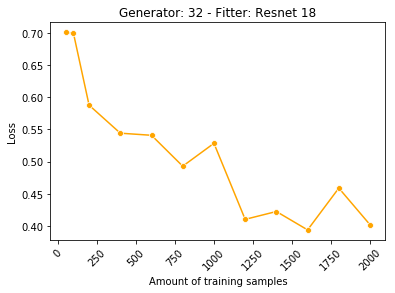

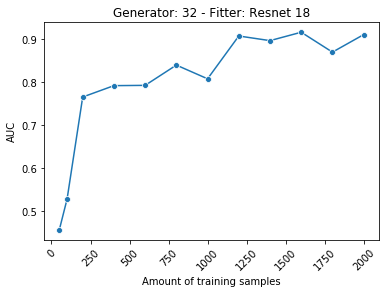

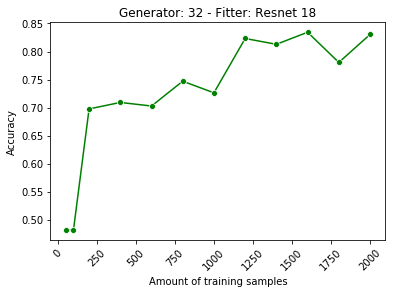

In [16]:
HF.plot_test("Generator: 32 - Fitter: Resnet 18")

# Training multiple fitters - (No error bands)

## Training loop

In [21]:
def training_loop():
    for generator_planes,tr in zip([8,16,32,64],[.4825,.335,.457,0.508]): # (genertor planes, treshold) pairs

        generator_blocks = [generator_planes]
        generator_n_blocks = len(generator_blocks)

        # load generated data
        generated_train_df = pd.read_csv(str(PATH/f'synthetic_experiment/generator/train_df_blocks_{generator_n_blocks}_planes_{"-".join([str(plane) for plane in generator_blocks])}.csv'))
        generated_valid_df = pd.read_csv(str(PATH/f'synthetic_experiment/generator/valid_df_blocks_{generator_n_blocks}_planes_{"-".join([str(plane) for plane in generator_blocks])}.csv'))
        generated_test_df = pd.read_csv(str(PATH/f'synthetic_experiment/generator/test_df_blocks_{generator_n_blocks}_planes_{"-".join([str(plane) for plane in generator_blocks])}.csv'))

        # fitter with 1 block and different amounts of planes.
        for fitter_planes in [8,16,32,64]:

            fitter_blocks = [fitter_planes]

            HF = handy_fitter(generator_blocks, 
                              blocks=fitter_blocks )  # example with blocks

            HF.create_dfs(train_df=generated_train_df, valid_df=generated_valid_df,
                  test_df=generated_test_df, tr=tr)

            HF.fit()

            HF.test()

        # fitter with premade models. (What people usually do)   
        for premade_model in [models.resnet18, models.resnet34]:

            HF = handy_fitter(generator_blocks, 
                              predefined=premade_model) # example with pre-defined

            HF.create_dfs(train_df=generated_train_df, valid_df=generated_valid_df,
                          test_df=generated_test_df, tr=tr)

            HF.fit()

            HF.test()
# training_loop()

## Plotting results

In [22]:
def plot_1():
    for generator_planes,tr in zip([8,16,32,64],[.4825,.335,.457,0.508]): # (genertor planes, treshold) pairs
        print('Generator planes: ', generator_planes)

        generator_blocks = [generator_planes]
        generator_n_blocks = len(generator_blocks)

        # load generated data
    #     generated_train_df = pd.read_csv(str(PATH/f'synthetic_experiment/generator/train_df_blocks_{generator_n_blocks}_planes_{"-".join([str(plane) for plane in generator_blocks])}.csv'))
    #     generated_valid_df = pd.read_csv(str(PATH/f'synthetic_experiment/generator/valid_df_blocks_{generator_n_blocks}_planes_{"-".join([str(plane) for plane in generator_blocks])}.csv'))
    #     generated_test_df = pd.read_csv(str(PATH/f'synthetic_experiment/generator/test_df_blocks_{generator_n_blocks}_planes_{"-".join([str(plane) for plane in generator_blocks])}.csv'))

        # fitter with 1 block and different amounts of planes.
        for fitter_planes in [8,16,32,64]:

            fitter_blocks = [fitter_planes]

            HF = handy_fitter(generator_blocks, 
                              blocks=fitter_blocks )  # example with blocks

    #         HF.create_dfs(train_df=generated_train_df, valid_df=generated_valid_df,
    #               test_df=generated_test_df, tr=tr)

    #         HF.fit()

    #         HF.test()

            HF.plot_test(f"Generator: {generator_planes} - Fitter: {fitter_planes}")

        # fitter with premade models. (What people usually do)   
        for premade_model in [models.resnet18, models.resnet34]:

            HF = handy_fitter(generator_blocks, 
                              predefined=premade_model) # example with pre-defined

    #         HF.create_dfs(train_df=generated_train_df, valid_df=generated_valid_df,
    #                       test_df=generated_test_df, tr=tr)

    #         HF.fit()

    #         HF.test()

            HF.plot_test(f"Generator: {generator_planes} - Fitter: {premade_model.__name__}")
    
# plot_1()

## Training Loop 2.0

Train with only one random state over all possible combinations of:

* Generator - 4xn_planes + linear
* Fitter - 2x predefined + 4x n_blocks + linear
* with and without transfer learning for the predefined.
* Noise - x4 amounts of noise

In [17]:
X_train_o,Y_train_o,X_val_o,Y_val_o,X_test_o,Y_test_o = load_all_data_from_linear_generator()

def loop_v2():
    for noise in [.05,.1,.2,.4]:
        ## LINEAR GENERATOR ##
        # load generated data
        generated_train_df = pd.read_csv(PATH/'synthetic_experiment/generator/train_df_linear.csv')
        generated_valid_df = pd.read_csv(PATH/'synthetic_experiment/generator/valid_df_linear.csv')
        generated_test_df = pd.read_csv(PATH/'synthetic_experiment/generator/test_df_linear.csv')

        # fitter with 1 block and different amounts of planes.
        for fitter_planes in [8,16,32,64]:

            fitter_blocks = [fitter_planes]

            HF = handy_fitter(generator_blocks='linear', 
                              blocks=fitter_blocks,
                                 noise=noise )  # example with blocks

            HF.create_dfs(train_df=generated_train_df, valid_df=generated_valid_df,
                  test_df=generated_test_df)

            HF.fit()

            HF.test()

        # fitter with premade models. (What people usually do)   
        for premade_model in [models.resnet18, models.resnet34]:

            for pretrained in [True,False]:
                HF = handy_fitter(generator_blocks='linear', 
                                  predefined=premade_model,
                                 pretrained=pretrained,
                                 noise=noise) # example with pre-defined

                HF.create_dfs(train_df=generated_train_df, valid_df=generated_valid_df,
                              test_df=generated_test_df)

                HF.fit()

                HF.test()


        HF = handy_fitter(generator_blocks='linear', 
                          linear=True,
                         noise=noise) # example with pre-defined

        HF.create_dfs(train_df=generated_train_df, valid_df=generated_valid_df,
                      test_df=generated_test_df)

        HF.data_linear(X_train_o,X_val_o,X_test_o)

        HF.fit()

        HF.test()

        ## NN ## generator

        for generator_planes,tr in zip([8,16,32,64],[.4825,.335,.457,0.508]): # (genertor planes, treshold) pairs

            generator_blocks = [generator_planes]
            generator_n_blocks = len(generator_blocks)

            # load generated data
            generated_train_df = pd.read_csv(str(PATH/f'synthetic_experiment/generator/train_df_blocks_{generator_n_blocks}_planes_{"-".join([str(plane) for plane in generator_blocks])}.csv'))
            generated_valid_df = pd.read_csv(str(PATH/f'synthetic_experiment/generator/valid_df_blocks_{generator_n_blocks}_planes_{"-".join([str(plane) for plane in generator_blocks])}.csv'))
            generated_test_df = pd.read_csv(str(PATH/f'synthetic_experiment/generator/test_df_blocks_{generator_n_blocks}_planes_{"-".join([str(plane) for plane in generator_blocks])}.csv'))

            # fitter with 1 block and different amounts of planes.
            for fitter_planes in [8,16,32,64]:

                fitter_blocks = [fitter_planes]

                HF = handy_fitter(generator_blocks, 
                                  blocks=fitter_blocks,
                                     noise=noise )  # example with blocks

                HF.create_dfs(train_df=generated_train_df, valid_df=generated_valid_df,
                      test_df=generated_test_df, tr=tr)

                HF.fit()

                HF.test()

            # fitter with premade models. (What people usually do)   
            for premade_model in [models.resnet18, models.resnet34]:

                for pretrained in [True,False]:
                    HF = handy_fitter(generator_blocks, 
                                      predefined=premade_model,
                                     pretrained=pretrained,
                                     noise=noise) # example with pre-defined

                    HF.create_dfs(train_df=generated_train_df, valid_df=generated_valid_df,
                                  test_df=generated_test_df, tr=tr)

                    HF.fit()

                    HF.test()


            HF = handy_fitter(generator_blocks, 
                              linear=True,
                             noise=noise) # example with pre-defined

            HF.create_dfs(train_df=generated_train_df, valid_df=generated_valid_df,
                          test_df=generated_test_df, tr=tr)

            HF.data_linear(X_train_o,X_val_o,X_test_o)

            HF.fit()

            HF.test()

# loop_v2()

# Aggregated AUC plots by noise/generator

In [136]:
class handy_fitter():
    def __init__(self, generator_blocks, blocks=None, predefined=None, linear=None, pretrained=False, freeze=False, noise=0,
                 PATH=Path('../hand_data/'), fit_path=Path('../hand_data/') / 'boneage-250/',
                 val_path=Path('../hand_data/') / 'boneage-224/'):

        if blocks is None and predefined is None and linear is None: raise ValueError(f"either blocks or predefined must be provided.")

        self.PATH = PATH
        self.fit_path = fit_path
        self.val_path = val_path
        self.data = 'hands'
        self.noise = noise
        self.plt_path = '../hand_data/synthetic_experiment/fitter/metrics_results'
        self.linear = linear
        self.generator_blocks = generator_blocks

        # takes care of change in generator to linear
        if generator_blocks=='linear': self.generator_specificatons = f'generator-linear-'
        else: self.generator_specificatons = f'generator-blocks-{len(self.generator_blocks)}-planes-{"-".join([str(plane) for plane in self.generator_blocks])}'

        # When the fitter is linear do:
        if linear is not None:

            self.fit = self._fit_linear
            self.test = self.linear_test
            # self.plot_test = self.plot_linear_test

            self.model_path = self._linear_model_name
            self._plot_name_specifications = self._linear_model_plot_specifications()


        if blocks is not None:

            self.pretrained = False
            self.blocks = blocks

            self.model = self._blocks_model

            self.model_path = self._blcoks_model_name

            self._plot_name_specifications = self._blocks_model_plot_specifications()

        elif predefined is not None:

            self.predefined = predefined
            self.pretrained = pretrained
            self.freeze = freeze

            self.model = self._predefined_model

            self.model_path = self._predefined_model_name

            self._plot_name_specifications = self._predefined_model_plot_specifications()


    def check_thresholds(self, df, ts=[.6, .5, .4, .3, .2], col='boneage'):

        prtgs = [percentage_over_threshold(df[col].values, t, False) for t in ts]
        ths = [f'Synthetic with tr={t}' for t in ts]
        rows = [(f"Original with tr={.5}", f"{50.:.3f}" + '%')] + list(zip(ths, prtgs))
        return pd.DataFrame(rows, columns=["Threshold", "Positive Rate"])

    def create_dfs(self, train_df=None, valid_df=None, test_df=None, tr=.5, col='boneage'):

        self.col = col
        if train_df is not None:
            train_df[col] = soft2hard(train_df[col], threshold=tr)
            self.train_df = train_df
        if valid_df is not None:
            valid_df[col] = soft2hard(valid_df[col], threshold=tr)
            self.valid_df = valid_df
        if test_df is not None:
            test_df[col] = soft2hard(test_df[col], threshold=tr)
            self.test_df = test_df

        if self.noise is not None:
            self.train_df[self.col] = self._add_noise(self.train_df[self.col].values)
            self.valid_df[self.col] = self._add_noise(self.valid_df[self.col].values)


    def data_linear(self, X_train, X_val, X_test, Y_train=None, Y_val=None, Y_test=None):

        self.X_train = X_train
        if Y_train is not None: self.Y_train = Y_train
        else: self.Y_train = self.train_df.boneage.values
        self.X_val = X_val
        if Y_val is not None: self.Y_val = Y_val
        else: self.Y_val = self.valid_df.boneage.values
        self.X_test = X_test
        if Y_test is not None: self.Y_test = Y_test
        else: self.Y_test = self.test_df.boneage.values

        if self.noise is not 0:
            self.Y_train = self._add_noise(self.Y_train)
            self.Y_val = self._add_noise(self.Y_val)

    def _add_noise(self, df_col):
        df_len = len(df_col)
        col_type = df_col.dtype

        df_idx = np.random.uniform(size=df_len) < self.noise

        df_col[df_idx] = np.logical_not(df_col[df_idx].astype(bool)).astype(col_type)

        return df_col


    def _blcoks_model_name(self, random_state, K):
        return self.PATH / ('synthetic_experiment/fitter/models/'+self.generator_specificatons + f'fitter-blocks-{len(self.blocks)}-planes-{"-".join([str(plane) for plane in self.blocks])}-randomState-{str(random_state)}-points-{K}-noise-{int(self.noise*100)}.pth')

    def _blocks_model_plot_specifications(self):
        return self.generator_specificatons + f'fitter-blocks-{len(self.blocks)}-planes-{"-".join([str(plane) for plane in self.blocks])}-noise-{0 if self.noise is None else int(self.noise*100)}'

    def _predefined_model_name(self, random_state, K):
        return self.PATH / (f'synthetic_experiment/fitter/models/'+self.generator_specificatons + f'fitter-{self.predefined.__name__}-randomState-{str(random_state)}-points-{K}-pretrained-{self.pretrained}-freeze-{self.freeze}-noise-{int(self.noise*100)}.pth')

    def _predefined_model_plot_specifications(self):
        return f'generator-blocks-{len(self.generator_blocks)}-planes-{"-".join([str(plane) for plane in self.generator_blocks])}fitter-{self.predefined.__name__}-pretrained-{self.pretrained}-freeze-{self.freeze}-noise-{int(self.noise*100)}'

    def _linear_model_name(self, random_state, K):
        return self.PATH / (f'synthetic_experiment/fitter/models/' + self.generator_specificatons + f'fitter-linear-randomState-{str(random_state)}-points-{K}-noise-{int(self.noise*100)}.joblib')

    def _linear_model_plot_specifications(self):
        return self.generator_specificatons + f'fitter-linear-noise-{int(self.noise*100)}'

    def _blocks_model(self):
        return meta_generator(3, self.blocks).cuda()

    def _predefined_model(self):
        return adapt_to_problem(self.predefined, 1, pretrained=self.pretrained, freeze=self.freeze).cuda()

    def fit(self, amounts=[50, 100, 200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], random_states=[42], bs=16,
            lr_low=1e-6, lr_high=0.001, epochs=20, epsilon=.001):

        valid_dl = DataBatches(self.valid_df, img_folder_path=self.val_path,
                               transforms=False, shuffle=False, data=self.data,
                               batch_size=bs, half=False, normalize=self.pretrained,
                               seed=42)


        for random_state in tqdm(random_states):#tqdm_notebook(random_states):
            # Shuffle training df
            self.train_df = self.train_df.sample(frac=1, random_state=random_state).reset_index(drop=True)

            for K in amounts:
                print(f"Samples: {K}")
                print(f"Random_state: {random_state}")

                # Create data loader
                train_dl = DataBatches(self.train_df.iloc[:K, :], img_folder_path=self.fit_path,
                                       transforms=True, shuffle=True, data=self.data,
                                       batch_size=bs, half=False, normalize=self.pretrained,
                                       seed=random_state)

                # Spin up training
                train_regular_policy(self.model(), self.model_path(random_state, K), train_dl, valid_dl, lr_low=lr_low,
                                     lr_high=lr_high,
                                     epochs=epochs, epsilon=epsilon, data='binary_task')

    def _fit_linear(self, random_states=[42], amounts=[50, 100, 200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]):

        tuned_parameters_ridge = [{'alpha': [.1, .2, .3, .4, .5, .6, .7, .8, .9, 1, 1.1],
                                   'fit_intercept': [True, False],
                                   'normalize': [True, False]},
                                  ]

        N,_ = self.X_train.shape
        print(self.model_path(42,50))

        for random_state in random_states:

            idxs = np.random.permutation(range(0, N))
            X_train_o = self.X_train[idxs, :]
            Y_train_o = self.Y_train[idxs]

            for amt in tqdm(amounts):#tqdm_notebook(amounts):

                X_train, Y_train = X_train_o[:amt,:], Y_train_o[:amt]

                X = np.concatenate([X_train, self.X_val], axis=0)
                Y = np.concatenate([Y_train, self.Y_val], axis=0)
                ps = PredefinedSplit([-1] * X_train.shape[0] + [0] * self.X_val.shape[0])

                gs_ridge = GridSearchCV(RidgeClassifier(random_state=42),
                                        tuned_parameters_ridge,
                                        cv=ps,
                                        scoring='accuracy', return_train_score=True)

                gs_ridge.fit(X, Y)

                dump(gs_ridge.best_estimator_,self.model_path(random_state, amt))


    def test(self, amounts=[50, 100, 200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], random_states=[42],
             persist=True, batch_size=16):
        self.test_dl = DataBatches(self.test_df, img_folder_path=self.fit_path,
                                   transforms=True, shuffle=False, data=self.data,
                                   batch_size=batch_size, half=False, normalize=self.pretrained,
                                   seed=42)

        self.amounts = amounts

        Losses = []
        AUCs = []
        Accuracys = []

        for K in tqdm(amounts):#tqdm_notebook(amounts):
            print('Points: ', K)
            Loss = []
            AUC = []
            Accuracy = []

            for random_state in tqdm(random_states, leave=False):#tqdm_notebook(random_states, leave=False):
                print('Random State: ', random_state)
                fitter = self.model()

                load_model(m=fitter, p=self.model_path(random_state, K))

                loss, auc, accuracy = TTA_test_metrics_chest_PvsNP(fitter, self.test_dl)

                Loss.append(loss)
                AUC.append(auc)
                Accuracy.append(accuracy)

            Losses.append(Loss)
            AUCs.append(AUC)
            Accuracys.append(Accuracy)

        self.Loss = np.array(Losses)
        self.AUC = np.array(AUCs)
        self.Accuracy = np.array(Accuracys)

        if persist:
            np.savetxt(self.plt_path + "/losses-" + self._plot_name_specifications + ".csv", self.Loss, delimiter=",")
            np.savetxt(self.plt_path + "/AUCs-" + self._plot_name_specifications + ".csv", self.AUC, delimiter=",")
            np.savetxt(self.plt_path + "/Accuracys-" + self._plot_name_specifications + ".csv", self.Accuracy,
                       delimiter=",")

    def linear_test(self, amounts=[50, 100, 200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], random_states=[42],
             persist=True):

        self.amounts = amounts

        AUCs = []
        Accuracys = []

        for K in tqdm(amounts):#tqdm_notebook(amounts):

            print('Points: ', K)
            AUC = []
            Accuracy = []

            for random_state in tqdm(random_states, leave=False):#tqdm_notebook(random_states, leave=False):
                print('Random State: ', random_state)

                clf = load(self.model_path(random_state, K))

                Y_pred = clf.predict(self.X_test)

                Accuracy.append(accuracy_score(self.Y_test, Y_pred))
                AUC.append(roc_auc_score(self.Y_test, Y_pred))

            AUCs.append(AUC)
            Accuracys.append(Accuracy)

        self.AUC = np.array(AUCs).squeeze()
        self.Accuracy = np.array(Accuracys).squeeze()

        print(self.AUC)
        print(self.Accuracy)

        if persist:
            np.savetxt(self.plt_path + "/AUCs-" + self._plot_name_specifications + ".csv", self.AUC, delimiter=",")
            np.savetxt(self.plt_path + "/Accuracys-" + self._plot_name_specifications + ".csv", self.Accuracy,
                       delimiter=",")


    def plot_test(self, title, amounts=[50, 100, 200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]):

        if not hasattr(self, 'amounts'): self.amounts = amounts
        if self.linear is None:
            if not hasattr(self, 'Loss'):
                self.Loss = np.genfromtxt(
                self.plt_path + "/losses-" + self._plot_name_specifications + ".csv", delimiter=",")
        if not hasattr(self, 'AUC'): self.AUC = np.genfromtxt(
            self.plt_path + "/AUCs-" + self._plot_name_specifications + ".csv", delimiter=",")
        if not hasattr(self, 'Accuracy'): self.Accuracy = np.genfromtxt(
            self.plt_path + "/Accuracys-" + self._plot_name_specifications + ".csv", delimiter=",")

        # print(self.Loss.shape)
        if len(self.AUC.shape) > 1:
            if self.linear is None: self._array2plot_bands(self.Loss, title, "orange", "Loss")
            self._array2plot_bands(self.AUC, title, None, "AUC")
            self._array2plot_bands(self.Accuracy, title, "green", "Accuracy")

        else:
            if self.linear is None: self._array2plot(self.Loss, title, "orange", "Loss")
            self._array2plot(self.AUC, title, None, "AUC")
            self._array2plot(self.Accuracy, title, "green", "Accuracy")

    def plot_linear_test(self, title, amounts=[50, 100, 200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]):

        if not hasattr(self, 'amounts'): self.amounts = amounts

        if not hasattr(self, 'AUC'): self.AUC = np.genfromtxt(
            self.plt_path + "/AUCs-" + self._plot_name_specifications + ".csv", delimiter=",")
        if not hasattr(self, 'Accuracy'): self.Accuracy = np.genfromtxt(
            self.plt_path + "/Accuracys-" + self._plot_name_specifications + ".csv", delimiter=",")

        if self.AUC.ndim > 1:
            # self._array2plot_bands(self.Loss, title, "orange", "Loss")
            self._array2plot_bands(self.AUC, title, None, "AUC")
            self._array2plot_bands(self.Accuracy, title, "green", "Accuracy")

        else:
            # self._array2plot(self.Loss, title, "orange", "Loss")
            self._array2plot(self.AUC, title, None, "AUC")
            self._array2plot(self.Accuracy, title, "green", "Accuracy")
            
    def get_AUC(self, amounts=[50, 100, 200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]):

        if not hasattr(self, 'amounts'): self.amounts = amounts

        if not hasattr(self, 'AUC'): self.AUC = np.genfromtxt(
            self.plt_path + "/AUCs-" + self._plot_name_specifications + ".csv", delimiter=",")

        return self.AUC

    def plot_linear_test_AUC(self, title, amounts=[50, 100, 200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]):

        if not hasattr(self, 'amounts'): self.amounts = amounts

        if not hasattr(self, 'AUC'): self.AUC = np.genfromtxt(
            self.plt_path + "/AUCs-" + self._plot_name_specifications + ".csv", delimiter=",")

        if self.AUC.ndim > 1:
            return self._array2plot_bands(self.AUC, title, None, "AUC", instantiate=False)

        else:
            # self._array2plot(self.Loss, title, "orange", "Loss")
            return self._array2plot(self.AUC, title, None, "AUC", instantiate=False)
#             self._array2plot(self.Accuracy, title, "green", "Accuracy")
                   
    def plot_test_AUC(self, title, label, ax, amounts=[50, 100, 200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]):

        if not hasattr(self, 'amounts'): self.amounts = amounts
#         if self.linear is None:
#             if not hasattr(self, 'Loss'):
#                 self.Loss = np.genfromtxt(
#                 self.plt_path + "/losses-" + self._plot_name_specifications + ".csv", delimiter=",")
        if not hasattr(self, 'AUC'): self.AUC = np.genfromtxt(
            self.plt_path + "/AUCs-" + self._plot_name_specifications + ".csv", delimiter=",")


        # print(self.Loss.shape)
        if len(self.AUC.shape) > 1:
#             if self.linear is None: self._array2plot_bands(self.Loss, title, "orange", "Loss")
            return self._array2plot_bands(self.AUC, title, None, "AUC", label,  ax=ax, instantiate=False)
#             self._array2plot_bands(self.Accuracy, title, "green", "Accuracy")

        else:
#             if self.linear is None: self._array2plot(self.Loss, title, "orange", "Loss")
            return self._array2plot(self.AUC, title, None, "AUC", label, ax=ax, instantiate=False)
#             self._array2plot(self.Accuracy, title, "green", "Accuracy")

    def _array2plot_bands(self, array, title, color, y_lab):
        mean, upper, lower = get_mean_and_boundaries(array)
        df = to_df(self.amounts, mean, upper, lower)
        plot(df, title, y_lab, color)

    def _array2plot(self, array, title, color, y_lab, label, ax=None, x_lab='Amount of training samples', instantiate=True):
        df = pd.DataFrame(list(zip(self.amounts, array)), columns=["x", "y"])
        if ax:
            if color is None:
    #             ax1 = sns.lineplot(x="x", y="y", data=df, style=0, markers=True, dashes=False, legend='full', label = label)
                ax.plot(df['x'], df['y'], 'o-', label=label)    
            else:
    #             ax1 = sns.lineplot(x="x", y="y", data=df, style=0, markers=True, dashes=False, legend='full', color=color, label = label)
                ax.plot(df['x'], df['y'], 'o-', label=label) 
        else:
            if color is None:
                print(label)
    #             ax1 = sns.lineplot(x="x", y="y", data=df, style=0, markers=True, dashes=False, legend='full', label = label)
                ax1, = plt.plot(df['x'], df['y'], 'o-', label=label)    
            else:
                print(label)
    #             ax1 = sns.lineplot(x="x", y="y", data=df, style=0, markers=True, dashes=False, legend='full', color=color, label = label)
                ax1, = plt.plot(df['x'], df['y'], 'o-', label=label) 
#         plt.setp(ax1.get_xticklabels(), rotation=45)
        plt.xticks(rotation=45)
        plt.ylim((.45, 1))
        plt.title(title)
        plt.xlabel(x_lab)
        plt.ylabel(y_lab)
        if instantiate:
            plt.show()
        else:
            return ax

In [180]:
X_train_o,Y_train_o,X_val_o,Y_val_o,X_test_o,Y_test_o = load_all_data_from_linear_generator()

def loop_print_linear_generator(noises=[.05,.1,.2,.4]):
    
    for noise in noises:

        plots = []
        fig, ax = plt.subplots()
        ## LINEAR GENERATOR ##
        # load generated data
        generated_train_df = pd.read_csv(PATH/'synthetic_experiment/generator/train_df_linear.csv')
        generated_valid_df = pd.read_csv(PATH/'synthetic_experiment/generator/valid_df_linear.csv')
        generated_test_df = pd.read_csv(PATH/'synthetic_experiment/generator/test_df_linear.csv')

        # fitter with 1 block and different amounts of planes.
        for fitter_planes in [8, 64]: #  16,32,

            fitter_blocks = [fitter_planes]

            HF = handy_fitter(generator_blocks='linear', 
                              blocks=fitter_blocks,
                                 noise=noise )  # example with blocks

            plots.append(HF.plot_test_AUC(f"Generator: linear - noise: {noise}",label = str(fitter_planes), ax=ax))

        # fitter with premade models. (What people usually do)   
        for premade_model in [ models.resnet34]: #  models.resnet18,

            for pretrained in [True]:

                HF = handy_fitter(generator_blocks='linear', 
                                  predefined=premade_model,
                                 pretrained=pretrained,
                                 noise=noise) # example with pre-defined


                plots.append(HF.plot_test_AUC(f"Generator: linear - noise: {noise}", label = premade_model.__name__, ax=ax))


        HF = handy_fitter(generator_blocks='linear', 
                          linear=True,
                         noise=noise) # example with pre-defined

        plots.append(HF.plot_test_AUC(f"Generator: linear - noise: {noise}", label = 'linear', ax=ax))

        #ax.legend(loc='upper center', ncol=4, frameon=False) #plt.legend(handles=plots, loc='upper center', ncol=4, frameon=False)
        ax.legend( ncol=1, frameon=False, bbox_to_anchor=(1, .8))
        ax.axhline(y=0.5, c='grey', alpha=.5)
        
        ### BLOCK generator  ###
        for generator_planes,tr in zip([8,16,32,64],[.4825,.335,.457,0.508]): # (genertor planes, treshold) pairs
            fig, ax = plt.subplots()
            generator_blocks = [generator_planes]
            generator_n_blocks = len(generator_blocks)

            # load generated data
            generated_train_df = pd.read_csv(str(PATH/f'synthetic_experiment/generator/train_df_blocks_{generator_n_blocks}_planes_{"-".join([str(plane) for plane in generator_blocks])}.csv'))
            generated_valid_df = pd.read_csv(str(PATH/f'synthetic_experiment/generator/valid_df_blocks_{generator_n_blocks}_planes_{"-".join([str(plane) for plane in generator_blocks])}.csv'))
            generated_test_df = pd.read_csv(str(PATH/f'synthetic_experiment/generator/test_df_blocks_{generator_n_blocks}_planes_{"-".join([str(plane) for plane in generator_blocks])}.csv'))

            # fitter with 1 block and different amounts of planes.
            for fitter_planes in [8, 64]:#[8,16,32,64]:

                fitter_blocks = [fitter_planes]

                HF = handy_fitter(generator_blocks, 
                                  blocks=fitter_blocks,
                                     noise=noise )  # example with blocks

                HF.plot_test_AUC(f"Generator: {generator_planes} noise: {noise}", label = str(fitter_planes), ax=ax)

            # fitter with premade models. (What people usually do)   
            for premade_model in [ models.resnet34]: # models.resnet18,

                for pretrained in [True]:#[True,False]:
                    HF = handy_fitter(generator_blocks, 
                                      predefined=premade_model,
                                     pretrained=pretrained,
                                     noise=noise) # example with pre-defined

                    HF.plot_test_AUC(f"Generator: {generator_planes} - noise: {noise}", label = str(premade_model.__name__), ax=ax)

            HF = handy_fitter(generator_blocks, 
                              linear=True,
                             noise=noise) # example with pre-defined

            HF.plot_test_AUC(f"Generator: {generator_planes} - noise: {noise}", label = 'linear', ax=ax)
            
            #ax.legend(loc='upper center', ncol=4, frameon=False, bbox_to_anchor=(1, 0.5)) #plt.legend(handles=plots, loc='upper center', ncol=4, frameon=False)
            ax.legend( ncol=1, frameon=False, bbox_to_anchor=(1, .8))
            ax.axhline(y=0.5, c='grey', alpha=.5)

            plt.show()

# loop_print_linear_generator(noises=[.05])

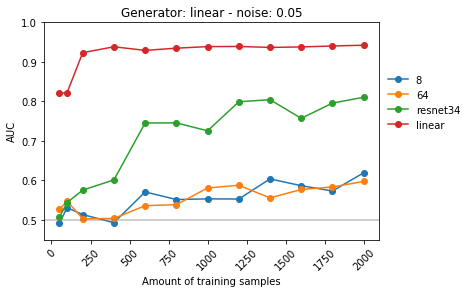

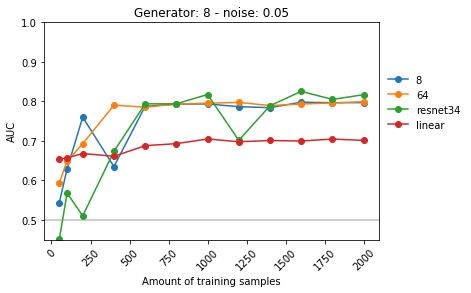

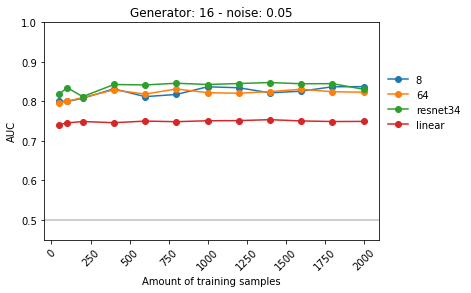

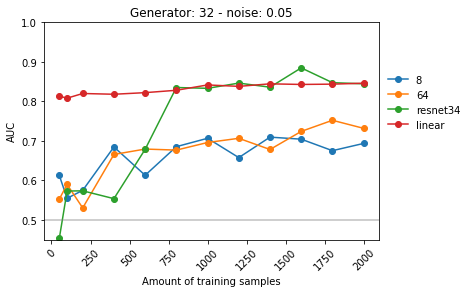

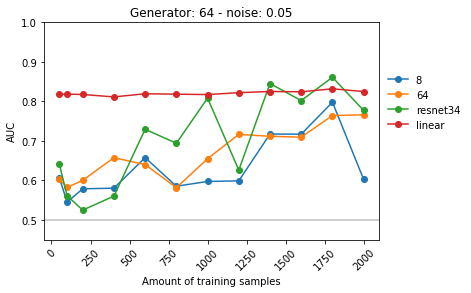

In [181]:
loop_print_linear_generator(noises=[.05])

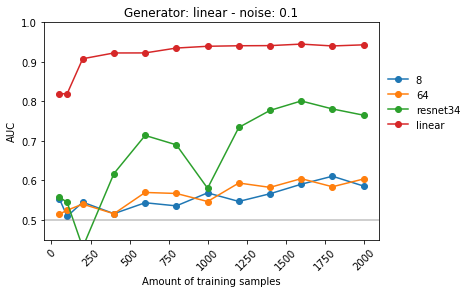

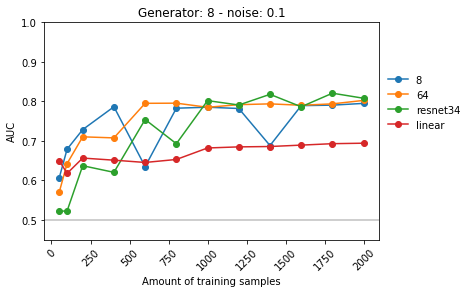

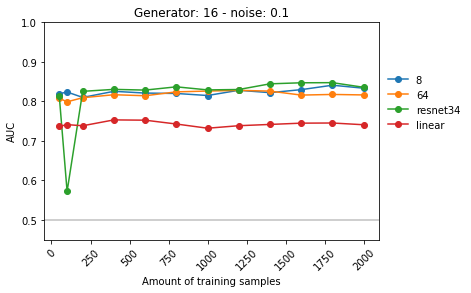

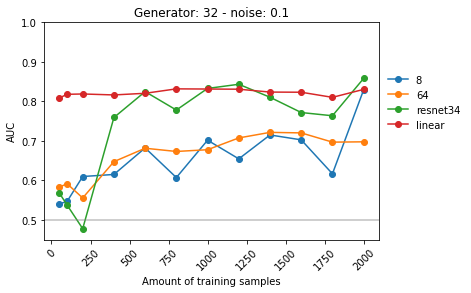

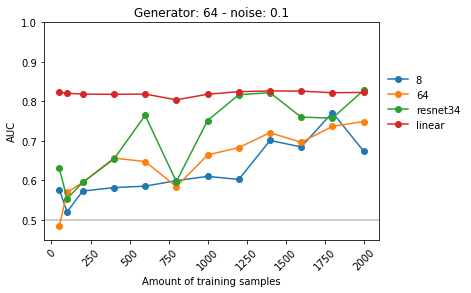

In [182]:
loop_print_linear_generator(noises=[.1])

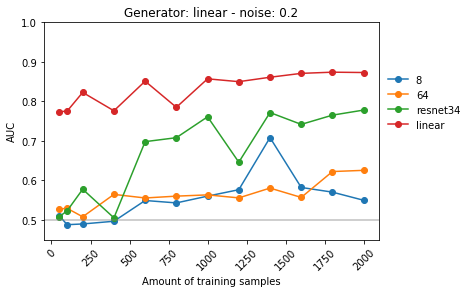

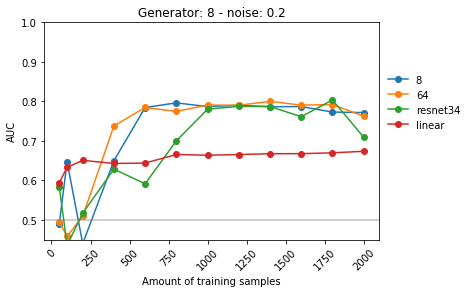

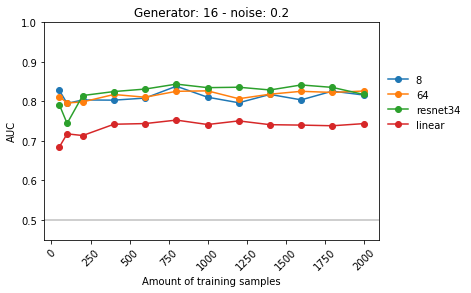

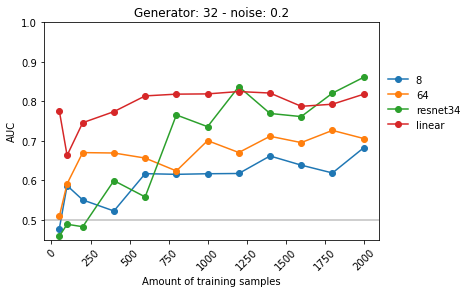

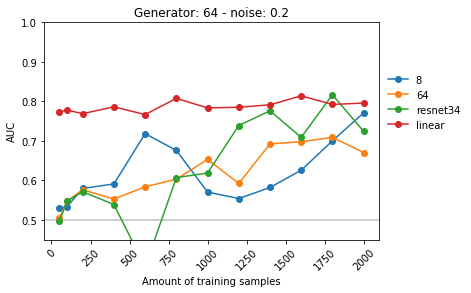

In [183]:
loop_print_linear_generator(noises=[.2])

In [175]:
X_train_o,Y_train_o,X_val_o,Y_val_o,X_test_o,Y_test_o = load_all_data_from_linear_generator()

def plot_geneartor_vs_average(noises=[.05,.1,.2,.4], generators = ['linear', 8, 16, 32, 64]):
    amounts = [50, 100, 200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]
    tr_dict = {k:v for k,v in zip([8,16,32,64],[.4825,.335,.457,0.508])}
    for noise in noises:

        for generator in generators:
            plots_data = []
            fig, ax = plt.subplots()

            if generator=='linear':
                ## LINEAR GENERATOR ##

                # load generated data
                generated_train_df = pd.read_csv(PATH/'synthetic_experiment/generator/train_df_linear.csv')
                generated_valid_df = pd.read_csv(PATH/'synthetic_experiment/generator/valid_df_linear.csv')
                generated_test_df = pd.read_csv(PATH/'synthetic_experiment/generator/test_df_linear.csv')

                # fitter with 1 block and different amounts of planes.
                for fitter_planes in [8,16,32,64]:

                    fitter_blocks = [fitter_planes]

                    HF = handy_fitter(generator_blocks='linear', 
                                      blocks=fitter_blocks,
                                         noise=noise )  # example with blocks

                    plots_data.append(HF.get_AUC())

                # fitter with premade models. (What people usually do)   
                for premade_model in [models.resnet18, models.resnet34]:

                    for pretrained in [True]:

                        HF = handy_fitter(generator_blocks='linear', 
                                          predefined=premade_model,
                                         pretrained=pretrained,
                                         noise=noise) # example with pre-defined


                        plots_data.append(HF.get_AUC())


                HF = handy_fitter(generator_blocks='linear', 
                                  linear=True,
                                 noise=noise) # example with pre-defined

                fitter_as_generator = HF.get_AUC()
                
                plt.title(f'Linear genertor - Noise:{int(noise*100)}%')

            else:
                ### BLOCK generator  ###
#                 for generator_planes,tr in zip([8,16,32,64],[.4825,.335,.457,0.508]): # (genertor planes, treshold) pairs
                tr = tr_dict[generator]
                generator_blocks = [generator]
                generator_n_blocks = len(generator_blocks)

                # load generated data
                generated_train_df = pd.read_csv(str(PATH/f'synthetic_experiment/generator/train_df_blocks_{generator_n_blocks}_planes_{"-".join([str(plane) for plane in generator_blocks])}.csv'))
                generated_valid_df = pd.read_csv(str(PATH/f'synthetic_experiment/generator/valid_df_blocks_{generator_n_blocks}_planes_{"-".join([str(plane) for plane in generator_blocks])}.csv'))
                generated_test_df = pd.read_csv(str(PATH/f'synthetic_experiment/generator/test_df_blocks_{generator_n_blocks}_planes_{"-".join([str(plane) for plane in generator_blocks])}.csv'))

                # fitter with 1 block and different amounts of planes.
                for fitter_planes in [8,16,32,64]:

                    fitter_blocks = [fitter_planes]

                    HF = handy_fitter(generator_blocks, 
                                      blocks=fitter_blocks,
                                         noise=noise )  # example with blocks

                    if fitter_planes == generator:
                        fitter_as_generator = HF.get_AUC()
                    else:
                        plots_data.append(HF.get_AUC())

                # fitter with premade models. (What people usually do)   
                for premade_model in [models.resnet18, models.resnet34]:

                    for pretrained in [True]:#[True,False]:
                        HF = handy_fitter(generator_blocks, 
                                          predefined=premade_model,
                                         pretrained=pretrained,
                                         noise=noise) # example with pre-defined

                        plots_data.append(HF.get_AUC())

                HF = handy_fitter(generator_blocks, 
                                  linear=True,
                                 noise=noise) # example with pre-defined

                plots_data.append(HF.get_AUC())
                plt.title(f'Resnet Block with {generator} channels - Noise:{int(noise*100)}%')

            # ploting
            mean = np.mean(plots_data, axis=0)
            std = np.std(plots_data, axis=0)

            ax.plot(amounts,mean, 'o-',label= "Other models' average performance")
            plt.fill_between(amounts, mean - 1.96*std, mean + 1.96*std,color='gray', alpha=0.2)
            ax.plot(amounts,fitter_as_generator, 'o-',label= 'fitter as generator')
            ax.legend(ncol=1, frameon=False, bbox_to_anchor=(1, .8))
            plt.ylim(.45,1)
            ax.axhline(y=0.5, c='grey', alpha=.5)

# plot_geneartor_vs_average(noises=[.05],)# generators=[ 8, 16, 32, 64])

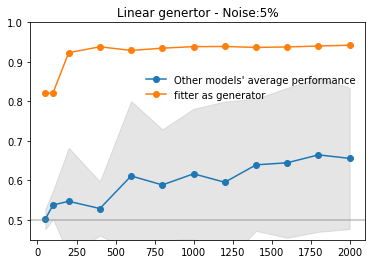

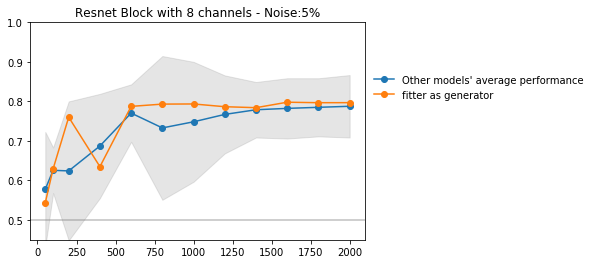

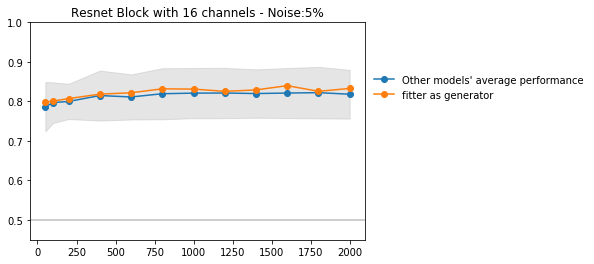

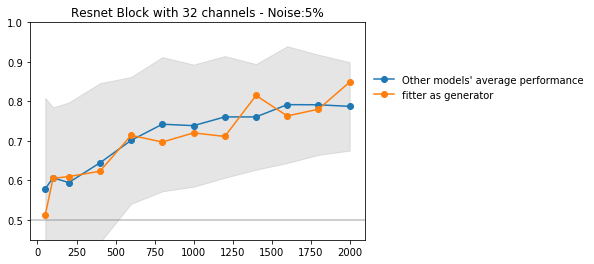

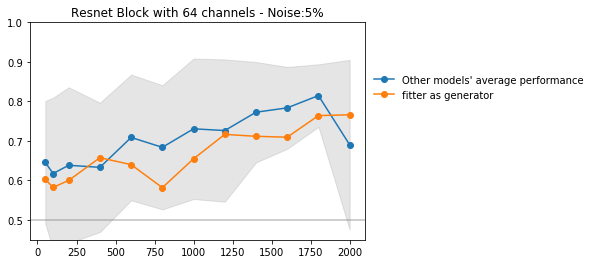

In [176]:
plot_geneartor_vs_average(noises=[.05],)

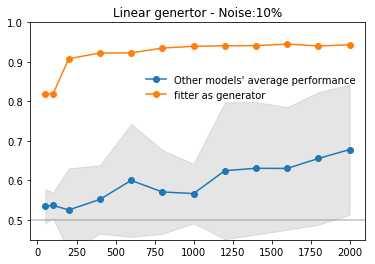

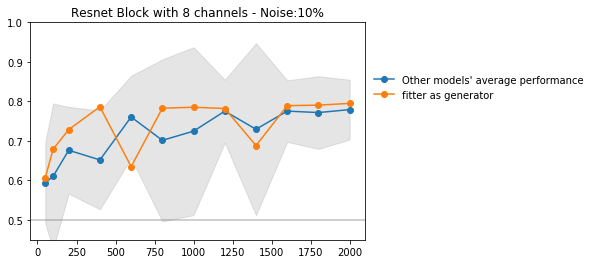

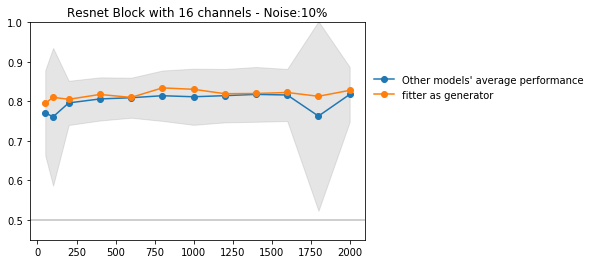

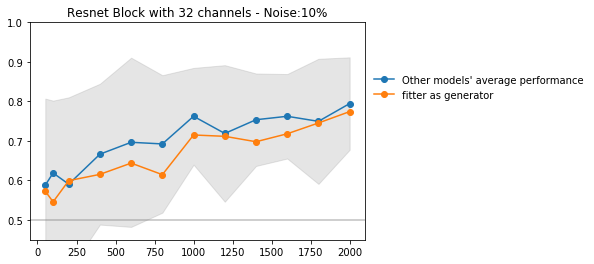

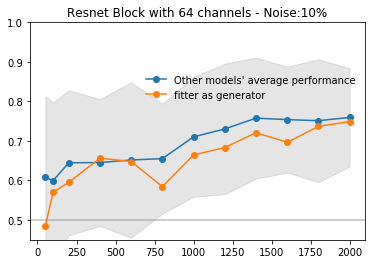

In [177]:
plot_geneartor_vs_average(noises=[.1],)

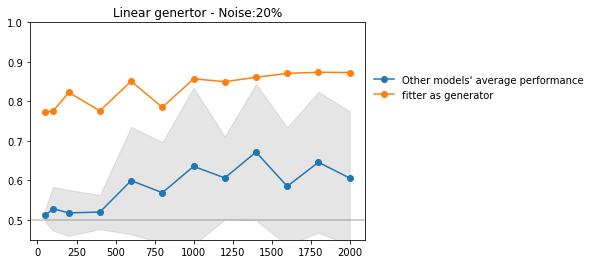

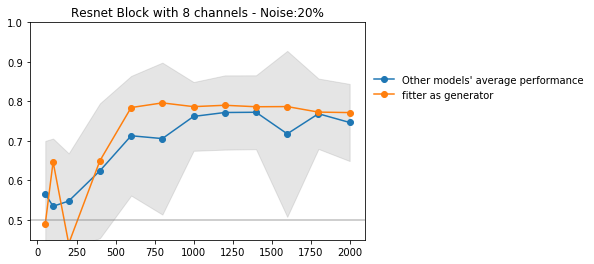

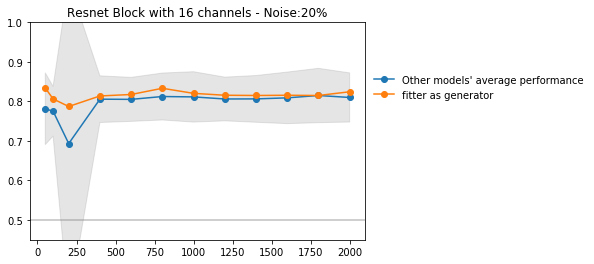

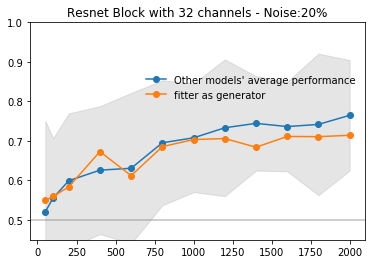

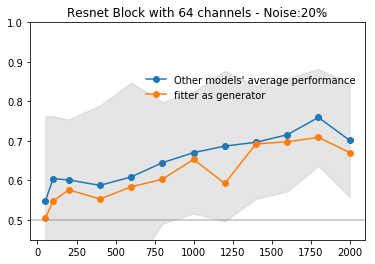

In [178]:
plot_geneartor_vs_average(noises=[.2],)

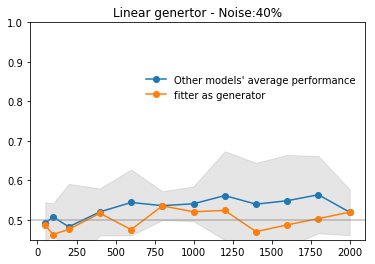

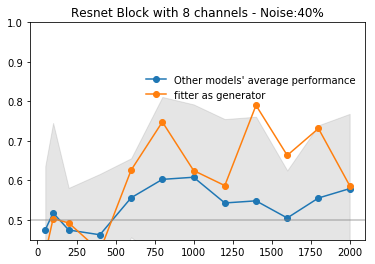

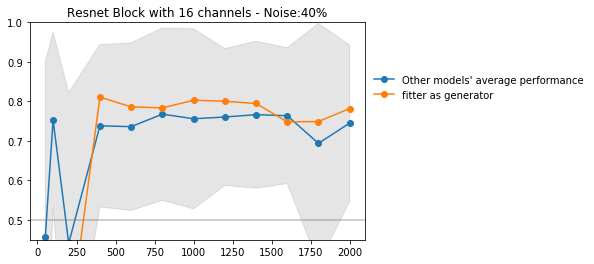

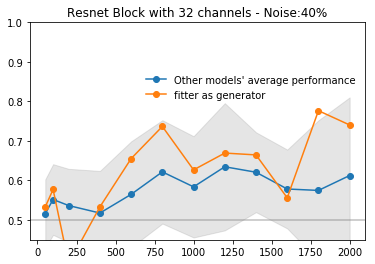

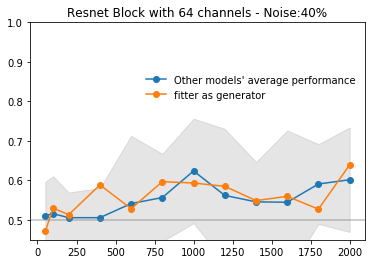

In [179]:
plot_geneartor_vs_average(noises=[.4],)

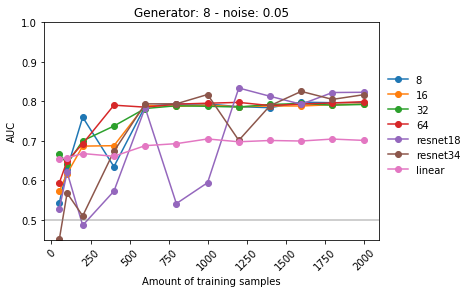

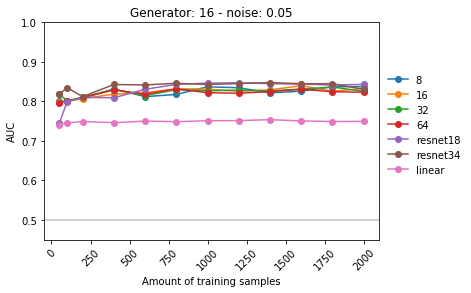

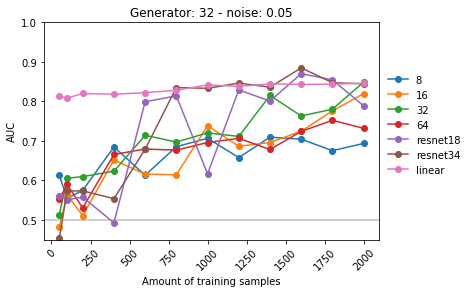

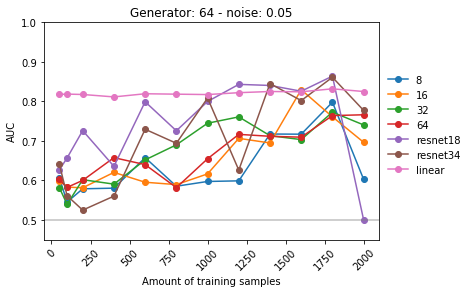

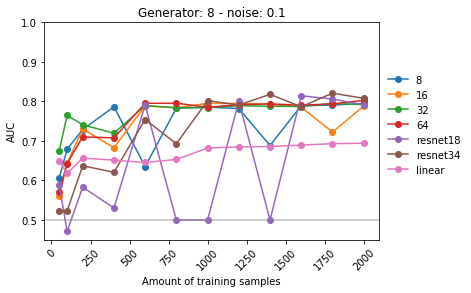

...

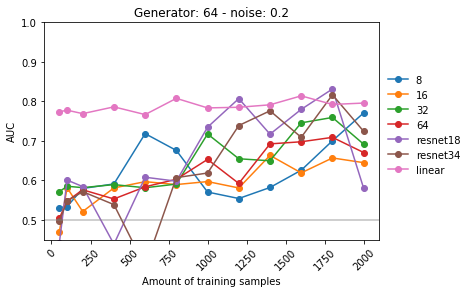

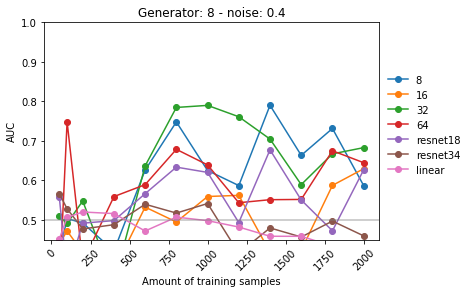

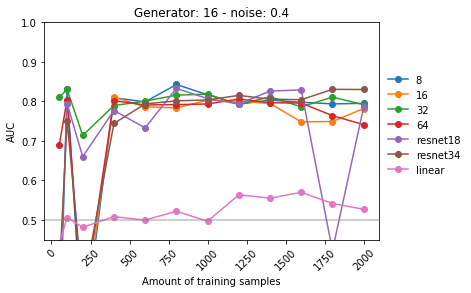

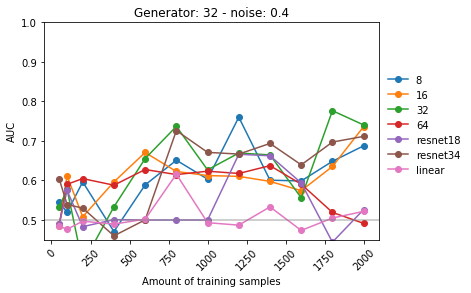

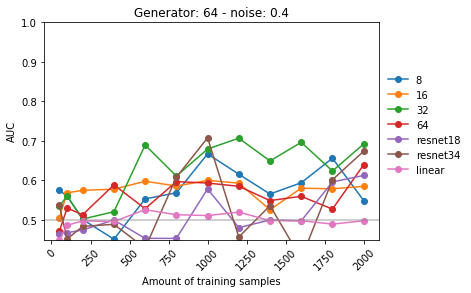

In [129]:
def loop_print_NN_generator(noises=[.05,.1,.2,.4]):
    for noise in noises:

    ## NN ## generator
        
        for generator_planes,tr in zip([8,16,32,64],[.4825,.335,.457,0.508]): # (genertor planes, treshold) pairs
            fig, ax = plt.subplots()
            generator_blocks = [generator_planes]
            generator_n_blocks = len(generator_blocks)

            # load generated data
            generated_train_df = pd.read_csv(str(PATH/f'synthetic_experiment/generator/train_df_blocks_{generator_n_blocks}_planes_{"-".join([str(plane) for plane in generator_blocks])}.csv'))
            generated_valid_df = pd.read_csv(str(PATH/f'synthetic_experiment/generator/valid_df_blocks_{generator_n_blocks}_planes_{"-".join([str(plane) for plane in generator_blocks])}.csv'))
            generated_test_df = pd.read_csv(str(PATH/f'synthetic_experiment/generator/test_df_blocks_{generator_n_blocks}_planes_{"-".join([str(plane) for plane in generator_blocks])}.csv'))

            # fitter with 1 block and different amounts of planes.
            for fitter_planes in [8,16,32,64]:

                fitter_blocks = [fitter_planes]

                HF = handy_fitter(generator_blocks, 
                                  blocks=fitter_blocks,
                                     noise=noise )  # example with blocks

                HF.plot_test_AUC(f"Generator: {generator_planes} noise: {noise}", label = str(fitter_planes), ax=ax)

            # fitter with premade models. (What people usually do)   
            for premade_model in [models.resnet18, models.resnet34]:

                for pretrained in [True]:#[True,False]:
                    HF = handy_fitter(generator_blocks, 
                                      predefined=premade_model,
                                     pretrained=pretrained,
                                     noise=noise) # example with pre-defined

                    HF.plot_test_AUC(f"Generator: {generator_planes} - noise: {noise}", label = str(premade_model.__name__), ax=ax)

            HF = handy_fitter(generator_blocks, 
                              linear=True,
                             noise=noise) # example with pre-defined

            HF.plot_test_AUC(f"Generator: {generator_planes} - noise: {noise}", label = 'linear', ax=ax)
            
            #ax.legend(loc='upper center', ncol=4, frameon=False, bbox_to_anchor=(1, 0.5)) #plt.legend(handles=plots, loc='upper center', ncol=4, frameon=False)
            ax.legend( ncol=1, frameon=False, bbox_to_anchor=(1, .8))
            ax.axhline(y=0.5, c='grey', alpha=.5)

            plt.show()
            
loop_print_NN_generator([.05,.1,.2,.4])

#  Individual plotting results

In [9]:
X_train_o,Y_train_o,X_val_o,Y_val_o,X_test_o,Y_test_o = load_all_data_from_linear_generator()

def loop_print(noises=[.05,.1,.2,.4]):
    for noise in noises:
        ## LINEAR GENERATOR ##
        # load generated data
        generated_train_df = pd.read_csv(PATH/'synthetic_experiment/generator/train_df_linear.csv')
        generated_valid_df = pd.read_csv(PATH/'synthetic_experiment/generator/valid_df_linear.csv')
        generated_test_df = pd.read_csv(PATH/'synthetic_experiment/generator/test_df_linear.csv')

        # fitter with 1 block and different amounts of planes.
        for fitter_planes in [8,16,32,64]:

            fitter_blocks = [fitter_planes]

            HF = handy_fitter(generator_blocks='linear', 
                              blocks=fitter_blocks,
                                 noise=noise )  # example with blocks

#             HF.create_dfs(train_df=generated_train_df, valid_df=generated_valid_df,
#                   test_df=generated_test_df)

#             HF.fit()

#             HF.test()
            HF.plot_test(f"Generator: linear - Fitter: {fitter_planes} - noise: {noise}")

        # fitter with premade models. (What people usually do)   
        for premade_model in [models.resnet18, models.resnet34]:

            for pretrained in [True,False]:
                HF = handy_fitter(generator_blocks='linear', 
                                  predefined=premade_model,
                                 pretrained=pretrained,
                                 noise=noise) # example with pre-defined

#                 HF.create_dfs(train_df=generated_train_df, valid_df=generated_valid_df,
#                               test_df=generated_test_df)

#                 HF.fit()

#                 HF.test()

                HF.plot_test(f"Generator: linear - Fitter: {premade_model.__name__} - noise: {noise}")


        HF = handy_fitter(generator_blocks='linear', 
                          linear=True,
                         noise=noise) # example with pre-defined

#         HF.create_dfs(train_df=generated_train_df, valid_df=generated_valid_df,
#                       test_df=generated_test_df)

#         HF.data_linear(X_train_o,X_val_o,X_test_o)

#         HF.fit()

#         HF.test()

        HF.plot_test(f"Generator: linear - Fitter: linear - noise: {noise}")


        ## NN ## generator

        for generator_planes,tr in zip([8,16,32,64],[.4825,.335,.457,0.508]): # (genertor planes, treshold) pairs

            generator_blocks = [generator_planes]
            generator_n_blocks = len(generator_blocks)

            # load generated data
            generated_train_df = pd.read_csv(str(PATH/f'synthetic_experiment/generator/train_df_blocks_{generator_n_blocks}_planes_{"-".join([str(plane) for plane in generator_blocks])}.csv'))
            generated_valid_df = pd.read_csv(str(PATH/f'synthetic_experiment/generator/valid_df_blocks_{generator_n_blocks}_planes_{"-".join([str(plane) for plane in generator_blocks])}.csv'))
            generated_test_df = pd.read_csv(str(PATH/f'synthetic_experiment/generator/test_df_blocks_{generator_n_blocks}_planes_{"-".join([str(plane) for plane in generator_blocks])}.csv'))

            # fitter with 1 block and different amounts of planes.
            for fitter_planes in [8,16,32,64]:

                fitter_blocks = [fitter_planes]

                HF = handy_fitter(generator_blocks, 
                                  blocks=fitter_blocks,
                                     noise=noise )  # example with blocks

#                 HF.create_dfs(train_df=generated_train_df, valid_df=generated_valid_df,
#                       test_df=generated_test_df, tr=tr)

#                 HF.fit()

#                 HF.test()
                HF.plot_test(f"Generator: {generator_planes} - Fitter: {fitter_planes} - noise: {noise}")

            # fitter with premade models. (What people usually do)   
            for premade_model in [models.resnet18, models.resnet34]:

                for pretrained in [True,False]:
                    HF = handy_fitter(generator_blocks, 
                                      predefined=premade_model,
                                     pretrained=pretrained,
                                     noise=noise) # example with pre-defined

#                     HF.create_dfs(train_df=generated_train_df, valid_df=generated_valid_df,
#                                   test_df=generated_test_df, tr=tr)

#                     HF.fit()

#                     HF.test()
                    HF.plot_test(f"Generator: {generator_planes} - Fitter: {premade_model.__name__} - noise: {noise}")

            HF = handy_fitter(generator_blocks, 
                              linear=True,
                             noise=noise) # example with pre-defined

#             HF.create_dfs(train_df=generated_train_df, valid_df=generated_valid_df,
#                           test_df=generated_test_df, tr=tr)

#             HF.data_linear(X_train_o,X_val_o,X_test_o)

#             HF.fit()

#             HF.test()
            HF.plot_test(f"Generator: {generator_planes} - Fitter: linear - noise: {noise}")

# Noise .05

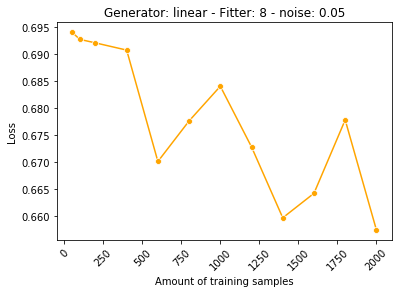

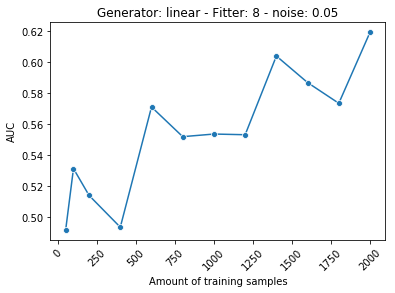

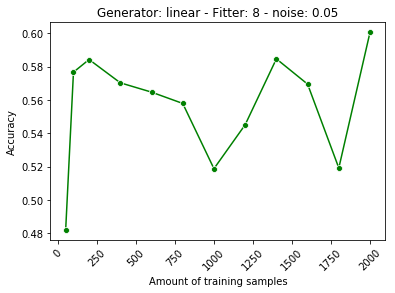

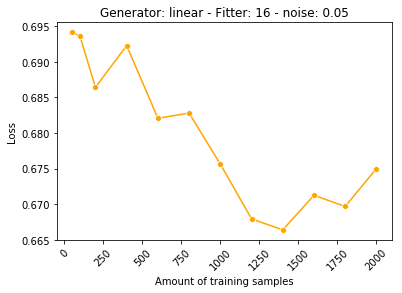

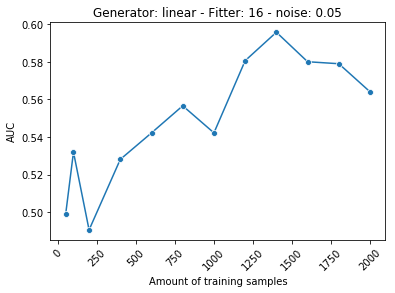

...

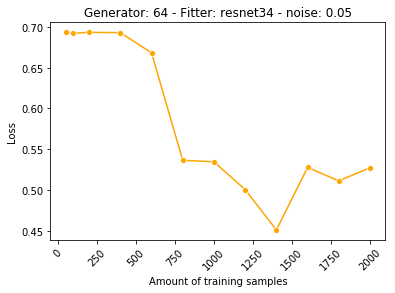

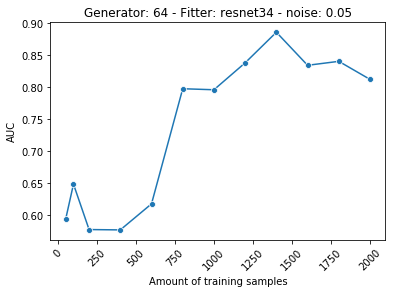

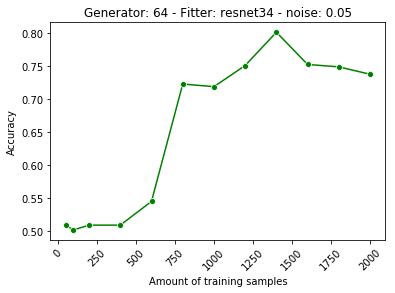

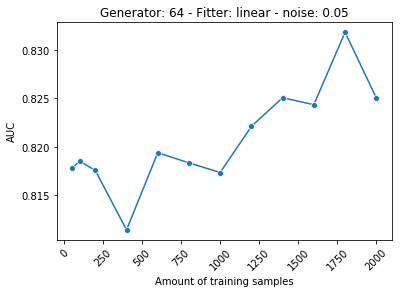

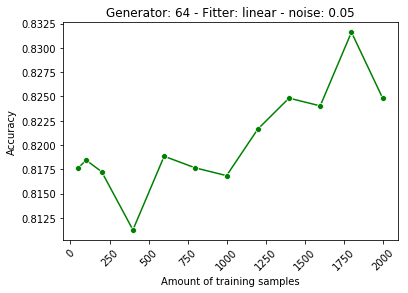

In [13]:
# Noise .05,.1,.2,.4
loop_print([.05])

# Noise .1

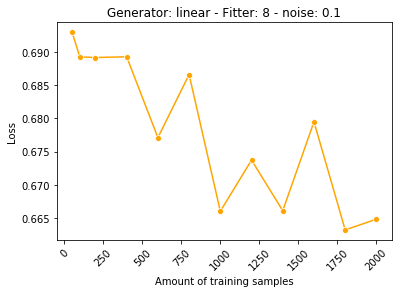

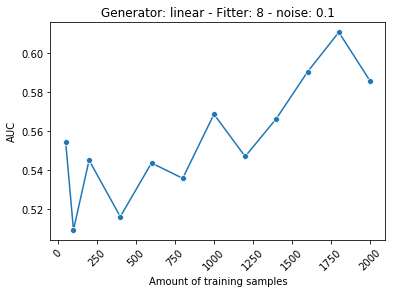

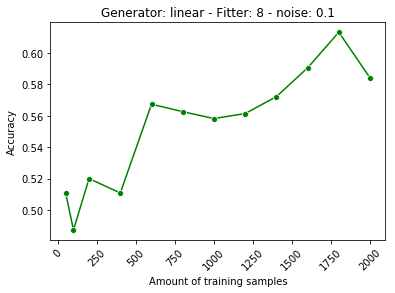

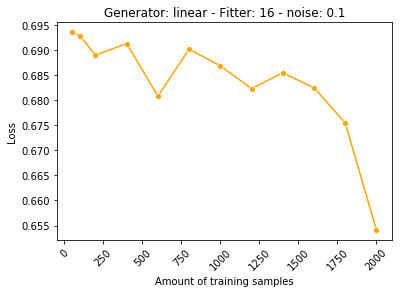

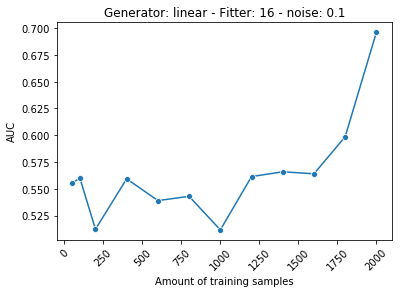

...

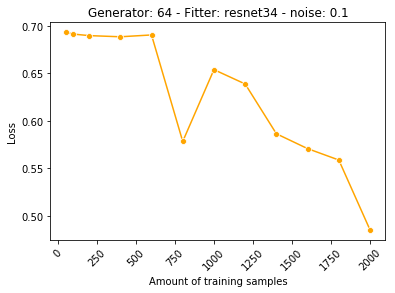

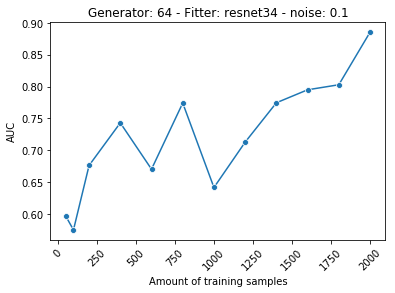

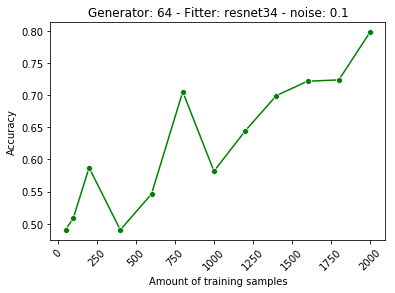

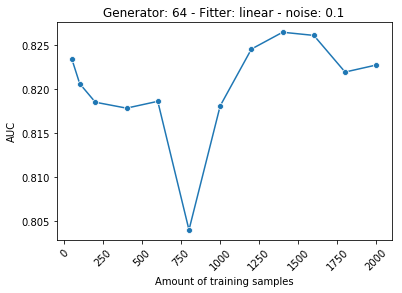

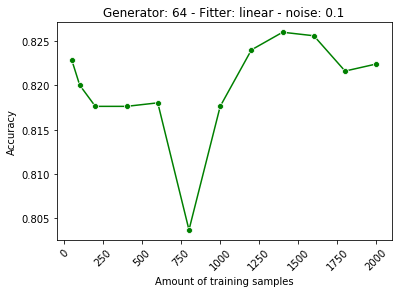

In [14]:
# Noise .05,.1,.2,.4
loop_print([.1])

# Noise .2

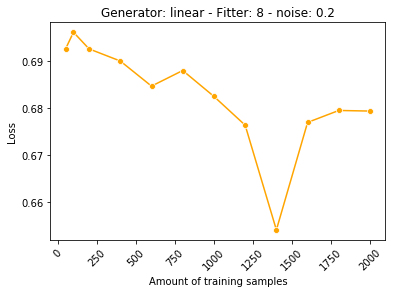

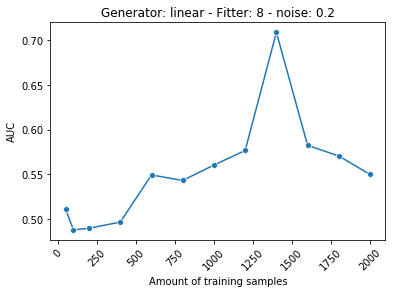

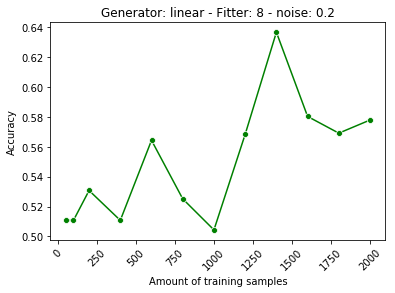

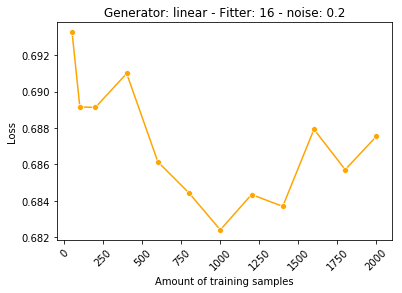

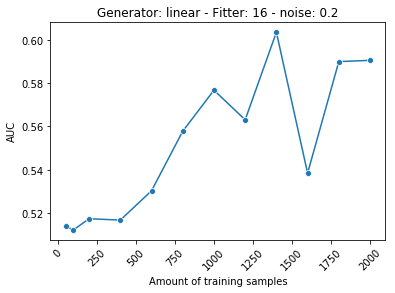

...

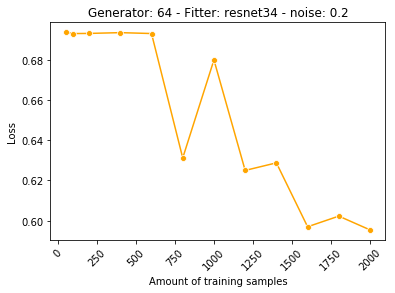

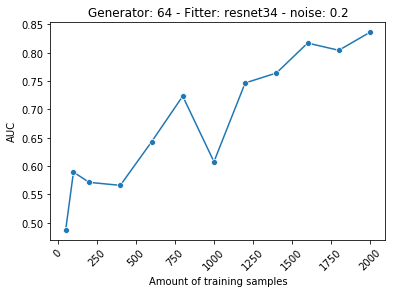

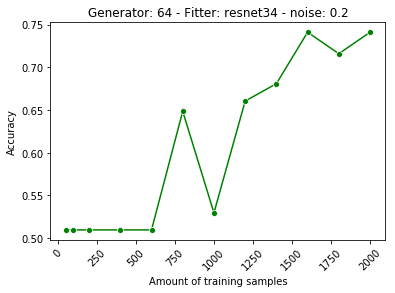

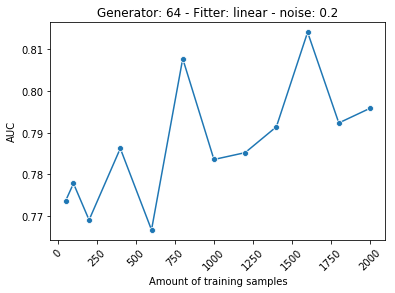

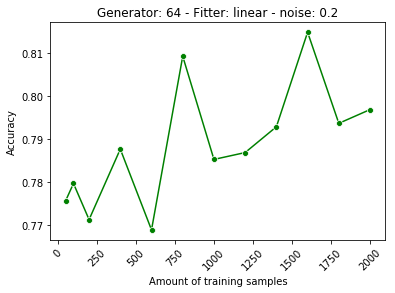

In [15]:
# Noise .05,.1,.2,.4
loop_print([.2])

# Noise .4

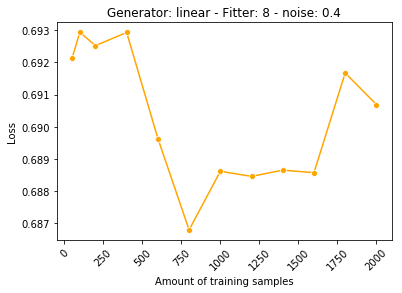

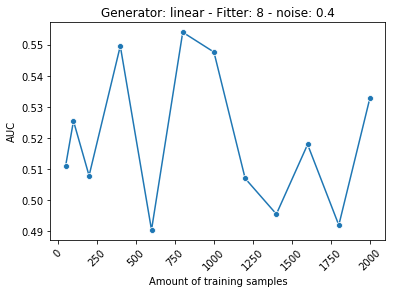

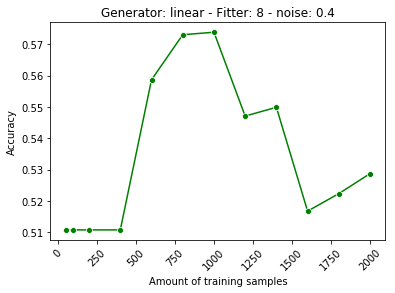

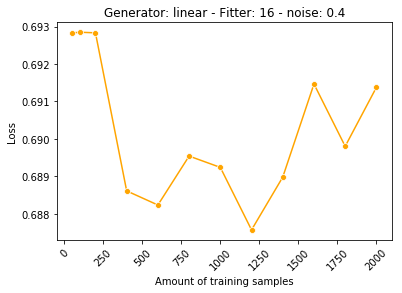

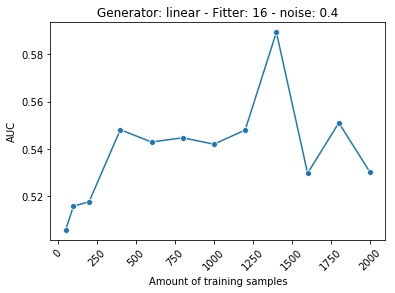

...

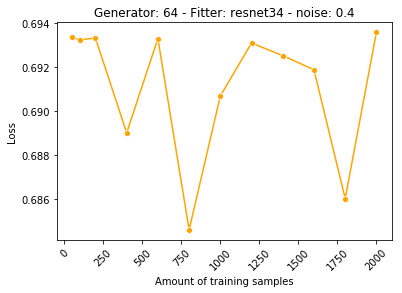

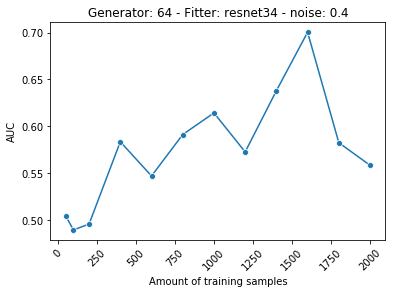

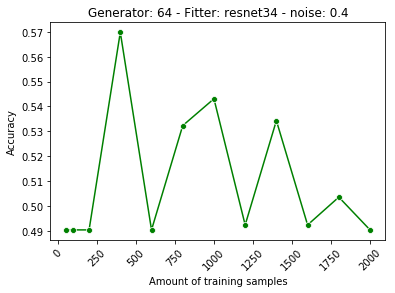

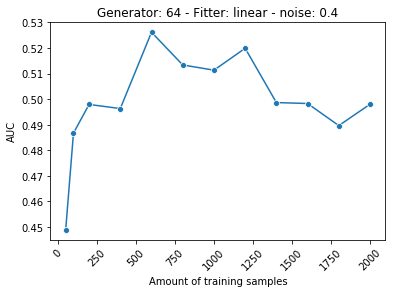

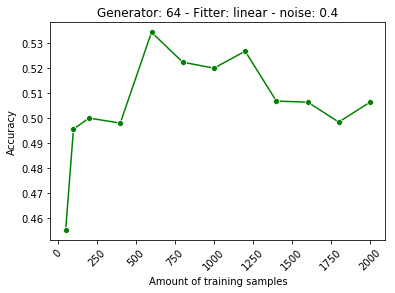

In [16]:
# Noise .05,.1,.2,.4
loop_print([.4])

## Test each treshold for generators.

In [34]:
def check_thresholds(generator_planes,ts=[.5,.475,.45,.425,.4] ):
    generator_blocks = [generator_planes]
    generator_n_blocks = len(generator_blocks)

    generated_train_df = pd.read_csv(str(PATH/f'synthetic_experiment/generator/train_df_blocks_{generator_n_blocks}_planes_{"-".join([str(plane) for plane in generator_blocks])}.csv'))
    generated_valid_df = pd.read_csv(str(PATH/f'synthetic_experiment/generator/valid_df_blocks_{generator_n_blocks}_planes_{"-".join([str(plane) for plane in generator_blocks])}.csv'))
    generated_test_df = pd.read_csv(str(PATH/f'synthetic_experiment/generator/test_df_blocks_{generator_n_blocks}_planes_{"-".join([str(plane) for plane in generator_blocks])}.csv'))

    HF = handy_fitter(generator_blocks, blocks=8 )  # fitter blocks irrelevant here
    return HF.check_thresholds(generated_train_df,ts=ts)

In [39]:
check_thresholds(8,ts=[.5,.49,.4825,.48])

,Threshold,Positive Rate
0,Original with tr=0.5,50.000%
1,Synthetic with tr=0.5,37.030%
2,Synthetic with tr=0.49,44.140%
3,Synthetic with tr=0.4825,49.905%
4,Synthetic with tr=0.48,52.103%


Choose `.4825`.

In [52]:
check_thresholds(16,ts=[.35,.335,.325,.3])

,Threshold,Positive Rate
0,Original with tr=0.5,50.000%
1,Synthetic with tr=0.35,35.853%
2,Synthetic with tr=0.335,50.880%
3,Synthetic with tr=0.325,60.155%
4,Synthetic with tr=0.3,75.541%


Choose `.335`.

In [59]:
check_thresholds(32,ts=[.5,.475,.457, .45,.425,.4])

,Threshold,Positive Rate
0,Original with tr=0.5,50.000%
1,Synthetic with tr=0.5,38.903%
2,Synthetic with tr=0.475,45.161%
3,Synthetic with tr=0.457,50.095%
4,Synthetic with tr=0.45,52.103%
5,Synthetic with tr=0.425,59.437%
6,Synthetic with tr=0.4,66.345%


Choose `.457`.

In [70]:
check_thresholds(64,ts=[.55,.525,.508,.5])

,Threshold,Positive Rate
0,Original with tr=0.5,50.000%
1,Synthetic with tr=0.55,38.466%
2,Synthetic with tr=0.525,45.273%
3,Synthetic with tr=0.508,50.230%
4,Synthetic with tr=0.5,52.630%


Choose `0.508`.